# <u>***Holiday Events Analysis - Walmart Sales Prediction***⚾👷🏻‍♀👷🏻‍♂🦃🎄</u>

### 🗺️***Road Map***🧭

**[1. Summary](#1.-Summary)**

**[2. Data Exploration](#2.-Data-Exploration)**

**[3. Exploratory Data Analysis (EDA)](#3.-Exploratory-Data-Analysis-(EDA))**

**[4. Data Preprocessing](#4.-Data-Preprocessing)**

**[5. Data Manipulation](#5.-Data-Manipulation)**

**[6. Feature Selection/Extraction](#6.-Feature-Selection/Extraction)**

> [6.1 Factor Analysis&SHAP](#6.1-Factor-Analysis&SHAP)

> [6.2 Multicollinearity Handling Techniques](#6.2-Multicollinearity-Handling-Techniques)

>> [6.2.1 Manual Method-VIF](#6.2.1-Manual-Method-VIF)

>> [6.2.2 Automatic Method-RFE](#6.2.2-Automatic-Method-RFE)

>> [6.2.3 Feature Elimination using PCA Decomposition](#6.2.3-Feature-Elimination-using-PCA-Decomposition)

**[7. Modelling&Model Performance](#7.-Modelling&Model-Performance)**

> [7.1 The Implementation of Multiple Linear Regression(MLR)](#7.1-The-Implementation-of-Multiple-Linear-Regression(MLR))

> [7.2 The Implementation of Ridge Regression Model](#7.2-The-Implementation-of-Ridge-Regression-Model)

> [7.3 The Implementation of Lasso Regression Model](#7.3-The-Implementation-of-Lasso-Regression-Model)

> [7.4 The Implementation of Elastic-Net Regression](#7.4-The-Implementation-of-Elastic-Net-Regression)

> [7.5 The Implementation of Polynomial Regression Model](#7.5-The-Implementation-of-Polynomial-Regression-Model)

> [7.6 Comparing the Evaluation Metrics of the Models](#7.6-Comparing-the-Evaluation-Metrics-of-the-Models)

**[8. Conclusion](#8.-Conclusion)**

**[9. References](#9.-References)**


# 1. Summary

## Description:

* One of the leading retail stores in the US, Walmart, would like to predict the sales and demand accurately.
* There are certain events and holidays that impact sales on each day.
* There are sales data available for 45 stores of Walmart.
* The business is facing a challenge due to unforeseen demands and runs out of stock some times, due to the inappropriate machine learning algorithm.
* An ideal ML algorithm will predict demand accurately and ingest factors like economic conditions including CPI, Unemployment Index, etc.

* Walmart runs several promotional markdown events throughout the year.
* These markdowns precede prominent holidays, the four largest of all, which are the Super Bowl, Labour Day, Thanksgiving, and Christmas.
* The weeks including these holidays are weighted five times higher in the evaluation than non-holiday weeks.
* Part of the challenge presented by this competition is modeling the effects of markdowns on these holiday weeks in the absence of complete/ideal historical data.
* Historical sales data for 45 Walmart stores located in different regions are available.

## Dataset Info: 

This is the historical data that covers sales from 2010-02-05 to 2012-11-01, in the file Walmart_Store_sales. Within this file you will find the following fields:

* Store - the store number
* Date - the week of sales
* Weekly_Sales - sales for the given store
* Holiday_Flag - whether the week is a special holiday week 1 – Holiday week 0 – Non-holiday week
* Temperature - Temperature on the day of sale
* Fuel_Price - Cost of fuel in the region
* CPI – Prevailing consumer price index
* Unemployment - Prevailing unemployment rate

*Holiday Events*

* **Super Bowl:** 12-Feb-10, 11-Feb-11, 10-Feb-12, 8-Feb-13
* **Labour Day:** 10-Sep-10, 9-Sep-11, 7-Sep-12, 6-Sep-13
* **Thanksgiving:** 26-Nov-10, 25-Nov-11, 23-Nov-12, 29-Nov-13
* **Christmas:** 31-Dec-10, 30-Dec-11, 28-Dec-12, 27-Dec-13

## Notes

* The dataset is taken from Kaggle (https://www.kaggle.com/datasets/yasserh/walmart-dataset).

* I applied 5 Regression Models--> Multiple Linear Regression (MLR), Ridge Regression, Lasso Regression, Elastic-Net Regression, and Polynomial Regression for predicting Sales and evaluated the model scores for comparison (R2, RMSE, RSS and MSE).

# 2. Data Exploration

In [5]:
#Importing the basic librarires

import os
import math
import numpy as np
import pandas as pd
import seaborn as sns
from IPython.display import display

#from brokenaxes import brokenaxes
from statsmodels.formula import api
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor

from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10,6]

import warnings 
warnings.filterwarnings('ignore')

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

def format_large_number(x, pos):
    return f'{x:,.0f}'  


pd.options.display.float_format = '{:,.2f}'.format


def apply_formatter():
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_large_number))


def custom_print(*args):
    formatted_args = []
    for arg in args:
        if isinstance(arg, (int, float)):  
            formatted_args.append(f'{arg:,.0f}')
        else:
            formatted_args.append(arg)
    print(*formatted_args)

In [7]:
import pandas as pd

# Importing the dataset
df = pd.read_csv('C:/Users/Tuba/Desktop/MINDSET-Python/Walmart.csv')

# Displaying the first few rows of the DataFrame
print(df.head())

original_df = df.copy(deep=True)

# Output the size of the dataset
print('\n\033[1mInference:\033[0m The Dataset consists of {} features & {} samples.'.format(df.shape[1], df.shape[0]))

   Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0      1  05-02-2010  1,643,690.90             0        42.31        2.57   
1      1  12-02-2010  1,641,957.44             1        38.51        2.55   
2      1  19-02-2010  1,611,968.17             0        39.93        2.51   
3      1  26-02-2010  1,409,727.59             0        46.63        2.56   
4      1  05-03-2010  1,554,806.68             0        46.50        2.62   

     CPI  Unemployment  
0 211.10          8.11  
1 211.24          8.11  
2 211.29          8.11  
3 211.32          8.11  
4 211.35          8.11  

Inference: The Dataset consists of 8 features & 6435 samples.


In [8]:
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'], format='%d-%m-%Y')

# Holiday event mapping
holiday_mapping = {
    '2010-02-12': 'Super Bowl', '2011-02-11': 'Super Bowl', '2012-02-10': 'Super Bowl', '2013-02-08': 'Super Bowl',
    '2010-09-10': 'Labour Day', '2011-09-09': 'Labour Day', '2012-09-07': 'Labour Day', '2013-09-06': 'Labour Day',
    '2010-11-26': 'Thanksgiving', '2011-11-25': 'Thanksgiving', '2012-11-23': 'Thanksgiving', '2013-11-29': 'Thanksgiving',
    '2010-12-31': 'Christmas', '2011-12-30': 'Christmas', '2012-12-28': 'Christmas', '2013-12-27': 'Christmas'
}

# Add 'Holiday Event' column based on mapping
df['Holiday_Event'] = df['Date'].dt.strftime('%Y-%m-%d').map(holiday_mapping).fillna('Non-Holiday')

# Display the updated DataFrame
print(df)

      Store       Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
0         1 2010-02-05  1,643,690.90             0        42.31        2.57   
1         1 2010-02-12  1,641,957.44             1        38.51        2.55   
2         1 2010-02-19  1,611,968.17             0        39.93        2.51   
3         1 2010-02-26  1,409,727.59             0        46.63        2.56   
4         1 2010-03-05  1,554,806.68             0        46.50        2.62   
...     ...        ...           ...           ...          ...         ...   
6430     45 2012-09-28    713,173.95             0        64.88        4.00   
6431     45 2012-10-05    733,455.07             0        64.89        3.98   
6432     45 2012-10-12    734,464.36             0        54.47        4.00   
6433     45 2012-10-19    718,125.53             0        56.47        3.97   
6434     45 2012-10-26    760,281.43             0        58.85        3.88   

        CPI  Unemployment Holiday_Event  
0    211.

In [9]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Event
0,1,2010-02-05,"1,643,690.90",0,42.31,2.57,211.10,8.11,Non-Holiday
1,1,2010-02-12,"1,641,957.44",1,38.51,2.55,211.24,8.11,Super Bowl
2,1,2010-02-19,"1,611,968.17",0,39.93,2.51,211.29,8.11,Non-Holiday
3,1,2010-02-26,"1,409,727.59",0,46.63,2.56,211.32,8.11,Non-Holiday
4,1,2010-03-05,"1,554,806.68",0,46.50,2.62,211.35,8.11,Non-Holiday
...,...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,"713,173.95",0,64.88,4.00,192.01,8.68,Non-Holiday
6431,45,2012-10-05,"733,455.07",0,64.89,3.98,192.17,8.67,Non-Holiday
6432,45,2012-10-12,"734,464.36",0,54.47,4.00,192.33,8.67,Non-Holiday
6433,45,2012-10-19,"718,125.53",0,56.47,3.97,192.33,8.67,Non-Holiday


In [10]:
# Reframing the columns

df.Date=pd.to_datetime(df.Date)

df['Weekday'] = df.Date.dt.weekday
df['Month'] = df.Date.dt.month
df['Year'] = df.Date.dt.year

df.drop(['Date'], axis=1, inplace=True)#,'month'

target = 'Weekly_Sales'
features = [i for i in df.columns if i not in [target]]
original_df = df.copy(deep=True)

df.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Event,Weekday,Month,Year
0,1,"1,643,690.90",0,42.31,2.57,211.10,8.11,Non-Holiday,4,2,2010
1,1,"1,641,957.44",1,38.51,2.55,211.24,8.11,Super Bowl,4,2,2010
2,1,"1,611,968.17",0,39.93,2.51,211.29,8.11,Non-Holiday,4,2,2010
3,1,"1,409,727.59",0,46.63,2.56,211.32,8.11,Non-Holiday,4,2,2010
4,1,"1,554,806.68",0,46.50,2.62,211.35,8.11,Non-Holiday,4,3,2010


In [11]:
df['Weekday'].value_counts()

Weekday
4    6435
Name: count, dtype: int64

In [12]:
#Checking the dtypes of all the columns

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Store          6435 non-null   int64  
 1   Weekly_Sales   6435 non-null   float64
 2   Holiday_Flag   6435 non-null   int64  
 3   Temperature    6435 non-null   float64
 4   Fuel_Price     6435 non-null   float64
 5   CPI            6435 non-null   float64
 6   Unemployment   6435 non-null   float64
 7   Holiday_Event  6435 non-null   object 
 8   Weekday        6435 non-null   int32  
 9   Month          6435 non-null   int32  
 10  Year           6435 non-null   int32  
dtypes: float64(5), int32(3), int64(2), object(1)
memory usage: 477.7+ KB


In [13]:
#Checking number of unique rows in each feature

df.nunique().sort_values()

Weekday             1
Holiday_Flag        2
Year                3
Holiday_Event       5
Month              12
Store              45
Unemployment      349
Fuel_Price        892
CPI              2145
Temperature      3528
Weekly_Sales     6435
dtype: int64

In [14]:
#Checking number of unique rows in each feature

nu = df[features].nunique().sort_values()
nf = []; cf = []; nnf = 0; ncf = 0; #numerical & categorical features

for i in range(df[features].shape[1]):
    if nu.values[i]<=45:cf.append(nu.index[i])
    else: nf.append(nu.index[i])

print('\n\033[1mInference:\033[0m The Dataset has {} numerical & {} categorical features.'.format(len(nf),len(cf)))


Inference: The Dataset has 4 numerical & 6 categorical features.


In [15]:
#Checking the stats of all the columns

display(df.describe())

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Month,Year
count,"6,435.00","6,435.00","6,435.00","6,435.00","6,435.00","6,435.00","6,435.00","6,435.00","6,435.00","6,435.00"
mean,23.00,"1,046,964.88",0.07,60.66,3.36,171.58,8.00,4.00,6.45,"2,010.97"
std,12.99,"564,366.62",0.26,18.44,0.46,39.36,1.88,0.00,3.24,0.80
min,1.00,"209,986.25",0.00,-2.06,2.47,126.06,3.88,4.00,1.00,"2,010.00"
25%,12.00,"553,350.10",0.00,47.46,2.93,131.74,6.89,4.00,4.00,"2,010.00"
50%,23.00,"960,746.04",0.00,62.67,3.44,182.62,7.87,4.00,6.00,"2,011.00"
75%,34.00,"1,420,158.66",0.00,74.94,3.73,212.74,8.62,4.00,9.00,"2,012.00"
max,45.00,"3,818,686.45",1.00,100.14,4.47,227.23,14.31,4.00,12.00,"2,012.00"


# 3. Exploratory Data Analysis (EDA)

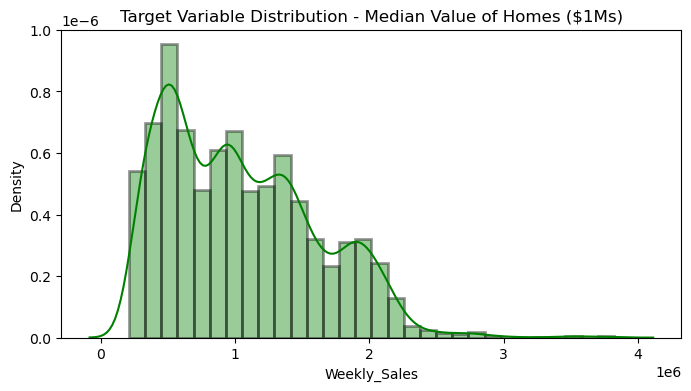

In [17]:
#Let us first analyze the distribution of the target variable

plt.figure(figsize=[8,4])
sns.distplot(df[target], color='g',hist_kws=dict(edgecolor="black", linewidth=2), bins=30)
plt.title('Target Variable Distribution - Median Value of Homes ($1Ms)')
plt.show()

                               Visualizing Categorical Features:                                


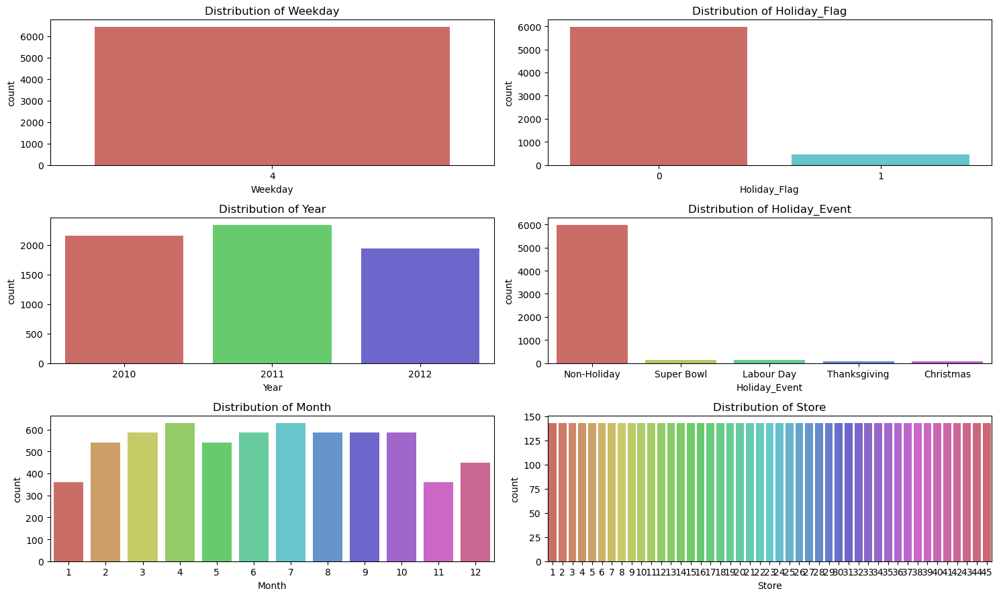

In [18]:
# Visualizing the categorical features

print('\033[1mVisualizing Categorical Features:'.center(100))

# Number of columns for the plot
n = 2
# Number of rows needed
num_rows = math.ceil(len(cf) / n)

# Create the figure
plt.figure(figsize=[15, 3 * num_rows])

# Loop through each feature
for i, feature in enumerate(cf):
    # Add a subplot
    plt.subplot(num_rows, n, i + 1)
    
    # Plot the countplot
    if df[feature].nunique() <= 8:
        sns.countplot(data=df, x=feature, palette='hls')
    else:
        sns.countplot(data=df, x=feature, palette='hls')
    
    # Add a title to each subplot
    plt.title(f'Distribution of {feature}', fontsize=12)

# Adjust the layout
plt.tight_layout()

# Show the plots
plt.show()

                                                Numeric Features Distribution                                                 


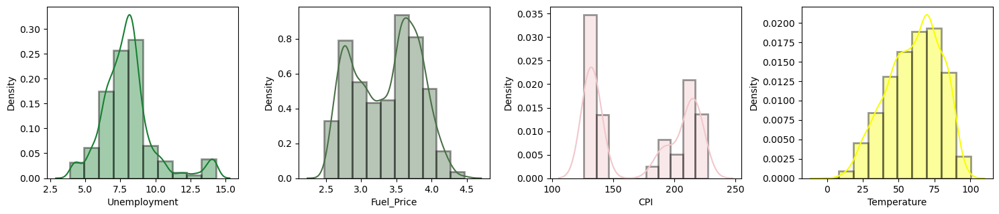

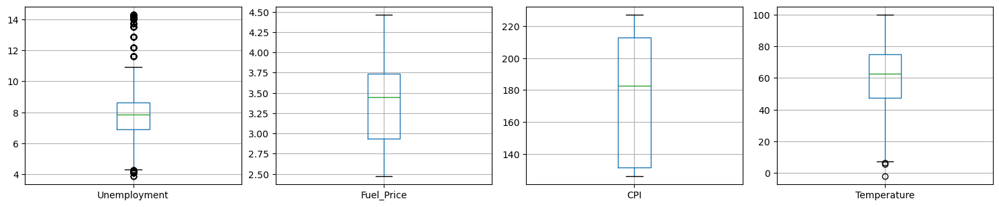

In [19]:
#Visualizing the numeric features 

print('\033[1mNumeric Features Distribution'.center(130))

n=4

clr=['r','g','b','g','b','r']

plt.figure(figsize=[15,6*math.ceil(len(nf)/n)])
for i in range(len(nf)):
    plt.subplot(math.ceil(len(nf)/3),n,i+1)
    sns.distplot(df[nf[i]],hist_kws=dict(edgecolor="black", linewidth=2), bins=10, color=list(np.random.randint([255,255,255])/255))
plt.tight_layout()
plt.show()

plt.figure(figsize=[15,6*math.ceil(len(nf)/n)])
for i in range(len(nf)):
    plt.subplot(math.ceil(len(nf)/3),n,i+1)
    df.boxplot(nf[i])
plt.tight_layout()
plt.show()

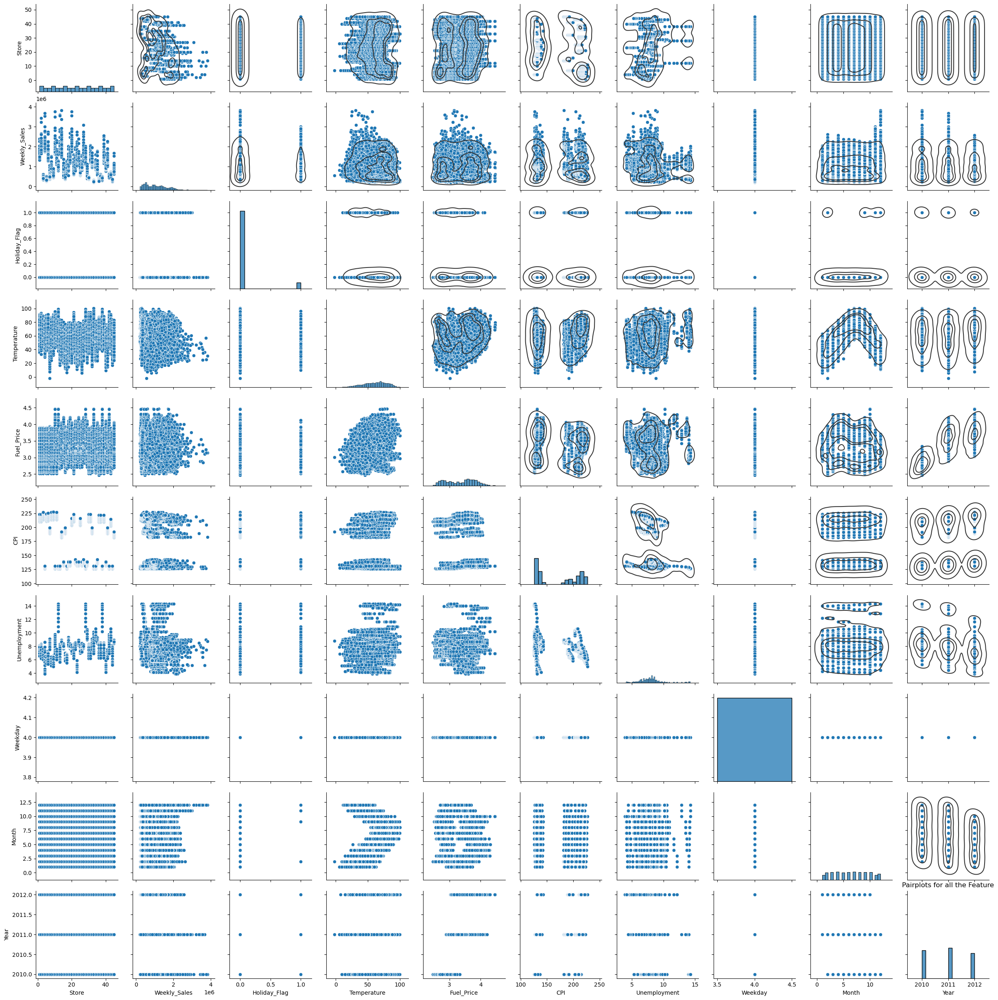

In [20]:
#Understanding the relationship between all the features

g = sns.pairplot(df)
plt.title('Pairplots for all the Feature')
g.map_upper(sns.kdeplot, levels=4, color=".2")
plt.show()

# 4. Data Preprocessing

In [22]:
#Removal of any Duplicate rows (if any)

counter = 0
rs,cs = original_df.shape

df.drop_duplicates(inplace=True)

if df.shape==(rs,cs):
    print('\n\033[1mInference:\033[0m The dataset doesn\'t have any duplicates')
else:
    print(f'\n\033[1mInference:\033[0m Number of duplicates dropped/fixed ---> {rs-df.shape[0]}')


Inference: The dataset doesn't have any duplicates


In [23]:
#Check for empty elements

nvc = pd.DataFrame(df.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = round(nvc['Total Null Values']/df.shape[0],3)*100
print(nvc)

               Total Null Values  Percentage
Store                          0        0.00
Weekly_Sales                   0        0.00
Holiday_Flag                   0        0.00
Temperature                    0        0.00
Fuel_Price                     0        0.00
CPI                            0        0.00
Unemployment                   0        0.00
Holiday_Event                  0        0.00
Weekday                        0        0.00
Month                          0        0.00
Year                           0        0.00


In [24]:
#Converting categorical Columns to Numeric

df3 = df.copy()

ecc = nvc[nvc['Percentage']!=0].index.values
fcc = [i for i in cf if i not in ecc]
#One-Hot Binary Encoding
oh=True
dm=True
for i in fcc:
    #print(i)
    if df3[i].nunique()==2:
        if oh==True: print("\033[1mOne-Hot Encoding on features:\033[0m")
        print(i);oh=False
        df3[i]=pd.get_dummies(df3[i], drop_first=True, prefix=str(i))
    if (df3[i].nunique()>2):
        if dm==True: print("\n\033[1mDummy Encoding on features:\033[0m")
        print(i);dm=False
        df3 = pd.concat([df3.drop([i], axis=1), pd.DataFrame(pd.get_dummies(df3[i], drop_first=True, prefix=str(i)))],axis=1)
        
df3.shape

One-Hot Encoding on features:
Holiday_Flag

Dummy Encoding on features:
Year
Holiday_Event
Month
Store


(6435, 68)

In [25]:
#Removal of outlier:

df1 = df3.copy()

#features1 = [i for i in features if i not in ['CHAS','RAD']]
features1 = nf

for i in features1:
    Q1 = df1[i].quantile(0.25)
    Q3 = df1[i].quantile(0.75)
    IQR = Q3 - Q1
    df1 = df1[df1[i] <= (Q3+(1.5*IQR))]
    df1 = df1[df1[i] >= (Q1-(1.5*IQR))]
    df1 = df1.reset_index(drop=True)
display(df1.head())
print('\n\033[1mInference:\033[0m\nBefore removal of outliers, The dataset had {} samples.'.format(df3.shape[0]))
print('After removal of outliers, The dataset now has {} samples.'.format(df1.shape[0]))

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour Day,...,Store_36,Store_37,Store_38,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45
0,"1,643,690.90",False,42.31,2.57,211.10,8.11,4,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,"1,641,957.44",True,38.51,2.55,211.24,8.11,4,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,"1,611,968.17",False,39.93,2.51,211.29,8.11,4,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,"1,409,727.59",False,46.63,2.56,211.32,8.11,4,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,"1,554,806.68",False,46.50,2.62,211.35,8.11,4,False,False,False,...,False,False,False,False,False,False,False,False,False,False



Inference:
Before removal of outliers, The dataset had 6435 samples.
After removal of outliers, The dataset now has 5953 samples.


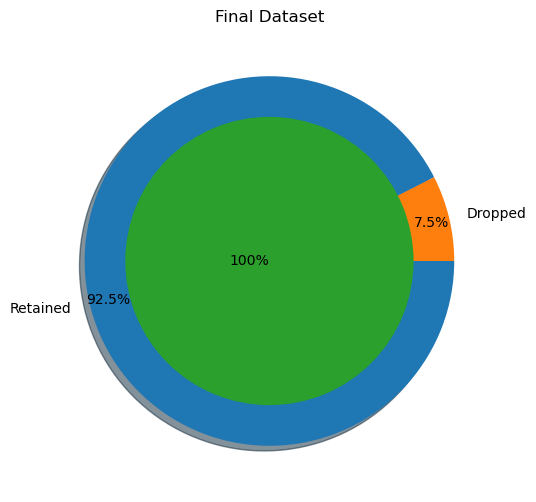


Inference: After the cleanup process, 482 samples were dropped, while retaining 7.49% of the data.


In [26]:
#Final Dataset size after performing Preprocessing

df = df1.copy()
df.columns=[i.replace('-','_') for i in df.columns]

plt.title('Final Dataset')
plt.pie([df.shape[0], original_df.shape[0]-df.shape[0]], radius = 1, labels=['Retained','Dropped'], counterclock=False, 
        autopct='%1.1f%%', pctdistance=0.9, explode=[0,0], shadow=True)
plt.pie([df.shape[0]], labels=['100%'], labeldistance=-0, radius=0.78)
plt.show()

print(f'\n\033[1mInference:\033[0m After the cleanup process, {original_df.shape[0]-df.shape[0]} samples were dropped, \
while retaining {round(100 - (df.shape[0]*100/(original_df.shape[0])),2)}% of the data.')

# 5. Data Manipulation

In [28]:
#Splitting the data intro training & testing sets

m=[]
for i in df.columns.values:
    m.append(i.replace(' ','_'))
    
df.columns = m
X = df.drop([target],axis=1)
Y = df[target]
Train_X, Test_X, Train_Y, Test_Y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=100)
Train_X.reset_index(drop=True,inplace=True)

print('Original set  ---> ',X.shape,Y.shape,'\nTraining set  ---> ',Train_X.shape,Train_Y.shape,'\nTesting set   ---> ', Test_X.shape,'', Test_Y.shape)

Original set  --->  (5953, 67) (5953,) 
Training set  --->  (4762, 67) (4762,) 
Testing set   --->  (1191, 67)  (1191,)


In [29]:
#Feature Scaling (Standardization)

std = StandardScaler()

print('\033[1mStandardardization on Training set'.center(120))
Train_X_std = std.fit_transform(Train_X)
Train_X_std = pd.DataFrame(Train_X_std, columns=X.columns)
display(Train_X_std.describe())

print('\n','\033[1mStandardardization on Testing set'.center(120))
Test_X_std = std.transform(Test_X)
Test_X_std = pd.DataFrame(Test_X_std, columns=X.columns)
display(Test_X_std.describe())

                                         Standardardization on Training set                                         


,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour_Day,Holiday_Event_Non_Holiday,...,Store_36,Store_37,Store_38,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45
count,"4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00",...,"4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00","4,762.00"
mean,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,...,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,1.00,1.00,...,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-0.27,-2.96,-1.87,-1.25,-2.76,0.00,-0.75,-0.64,-0.15,-3.65,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
25%,-0.27,-0.73,-0.99,-1.08,-0.68,0.00,-0.75,-0.64,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
50%,-0.27,0.11,0.17,0.38,0.10,0.00,-0.75,-0.64,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
75%,-0.27,0.77,0.84,0.99,0.61,0.00,1.33,1.57,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
max,3.65,2.17,2.47,1.34,2.58,0.00,1.33,1.57,6.73,0.27,...,6.36,6.30,22.98,6.33,7.65,6.50,6.36,6.14,6.44,6.56



                                          Standardardization on Testing set                                          


,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour_Day,Holiday_Event_Non_Holiday,...,Store_36,Store_37,Store_38,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45
count,"1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00",...,"1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00","1,191.00"
mean,0.01,0.04,0.08,0.02,-0.05,0.00,0.05,0.07,-0.02,-0.01,...,-0.00,-0.02,0.11,-0.01,-0.00,0.03,-0.00,-0.06,0.02,0.05
std,1.01,1.00,0.97,1.00,1.01,0.00,1.01,1.03,0.95,1.01,...,0.99,0.94,1.88,0.97,1.00,1.09,0.99,0.81,1.05,1.13
min,-0.27,-2.86,-1.78,-1.25,-2.76,0.00,-0.75,-0.64,-0.15,-3.65,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
25%,-0.27,-0.66,-0.85,-1.08,-0.70,0.00,-0.75,-0.64,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
50%,-0.27,0.19,0.30,0.39,0.06,0.00,-0.75,-0.64,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
75%,-0.27,0.82,0.84,1.02,0.61,0.00,1.33,1.57,-0.15,0.27,...,-0.16,-0.16,-0.04,-0.16,-0.13,-0.15,-0.16,-0.16,-0.16,-0.15
max,3.65,2.04,2.47,1.35,2.58,0.00,1.33,1.57,6.73,0.27,...,6.36,6.30,22.98,6.33,7.65,6.50,6.36,6.14,6.44,6.56


# 6. Feature Selection/Extraction

                                       Correlation Matrix                                       


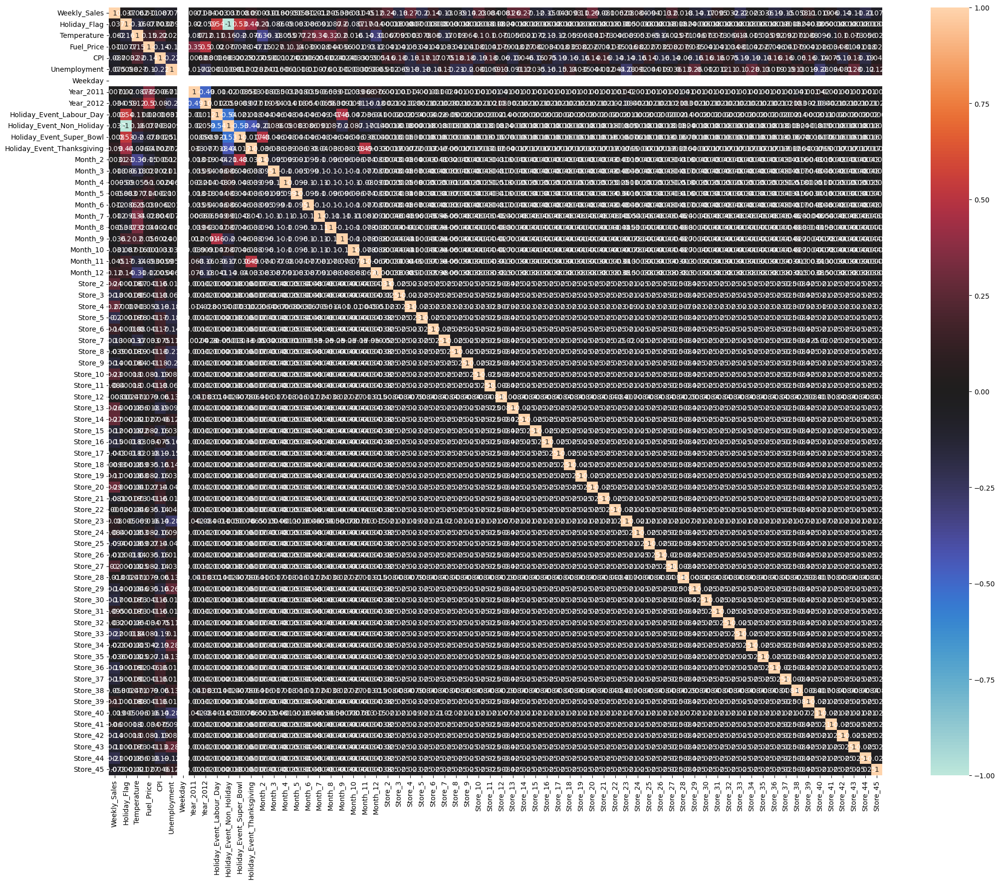

In [31]:
#Checking the correlation

print('\033[1mCorrelation Matrix'.center(100))
plt.figure(figsize=[25,20])
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, center=0) #cmap='BuGn'
plt.show()

In [32]:
df.columns

Index(['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI',
       'Unemployment', 'Weekday', 'Year_2011', 'Year_2012',
       'Holiday_Event_Labour_Day', 'Holiday_Event_Non_Holiday',
       'Holiday_Event_Super_Bowl', 'Holiday_Event_Thanksgiving', 'Month_2',
       'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7', 'Month_8',
       'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Store_2', 'Store_3',
       'Store_4', 'Store_5', 'Store_6', 'Store_7', 'Store_8', 'Store_9',
       'Store_10', 'Store_11', 'Store_12', 'Store_13', 'Store_14', 'Store_15',
       'Store_16', 'Store_17', 'Store_18', 'Store_19', 'Store_20', 'Store_21',
       'Store_22', 'Store_23', 'Store_24', 'Store_25', 'Store_26', 'Store_27',
       'Store_28', 'Store_29', 'Store_30', 'Store_31', 'Store_32', 'Store_33',
       'Store_34', 'Store_35', 'Store_36', 'Store_37', 'Store_38', 'Store_39',
       'Store_40', 'Store_41', 'Store_42', 'Store_43', 'Store_44', 'Store_45'],
      dtype='object')

In [33]:
Train_Y

4030   1,539,230.32
3264     780,444.94
743    2,090,268.95
2022     610,641.42
489    1,900,246.47
           ...     
1890     583,210.87
350      367,405.40
79     1,525,147.09
3927     436,462.63
5640     593,138.59
Name: Weekly_Sales, Length: 4762, dtype: float64

[🗺️Road Map🧭](#🗺️Road-Map🧭)

## 6.1 Factor Analysis&SHAP 

In [36]:
# Factor Analysis Application

from sklearn.decomposition import FactorAnalysis
factor_columns = ['Temperature', 'Fuel_Price', 'CPI', 'Unemployment']
fa = FactorAnalysis(n_components=2, random_state=42)
df_factors = fa.fit_transform(df[factor_columns])
df['Factor1'] = df_factors[:, 0]
df['Factor2'] = df_factors[:, 1]

# Training of MLR
MLR = LinearRegression().fit(Train_X_std, Train_Y)

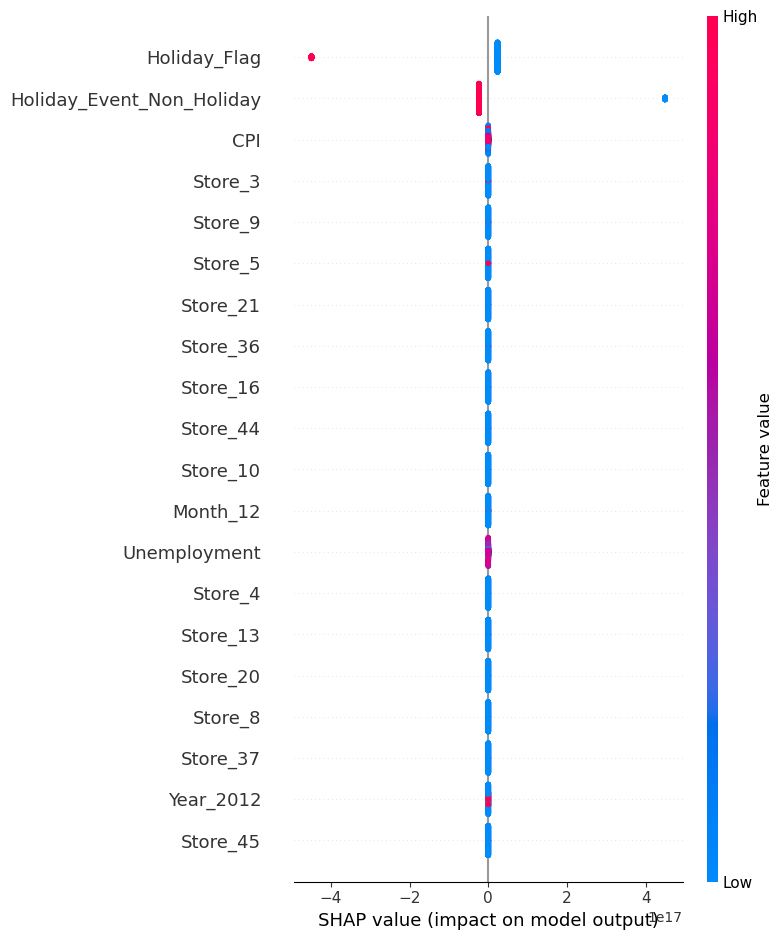

In [37]:
# Calculating SHAP Values and Visualizing

import shap
explainer = shap.Explainer(MLR, Test_X_std)
shap_values = explainer(Test_X_std)

shap.summary_plot(shap_values, features=Test_X_std, feature_names=Train_X.columns)

### SHAP Insights

**1. Key Features**

*Holiday_Flag:* This feature seems to have the highest impact on the model, indicating that whether a holiday is present or not significantly influences the predictions. Positive values suggest that holidays may increase sales.

*Holiday_Event_Non_Holiday:* This feature shows the impact of non-holiday periods. It helps to understand how the model handles the absence of holiday events compared to holiday periods.

*CPI (Consumer Price Index):* Ranked as the second most influential feature. Since CPI typically reflects the economic situation, it is logical that it impacts sales.

**2. Other Features**

*Store Features (e.g., Store_3, Store_9):* Different stores seem to have varying effects on sales, indicating that each store’s sales performance may differ.

*Year and Month:* Both the year and month have an impact on the model. 
 
 For example:

*Year_2012:* Represents the impact of a specific year on the model’s predictions.

*Month_12:* December, often during the holiday season, may have a strong impact on sales predictions.

**3. Direction and Strength of Effects**

The left side of the graph represents negative effects, while the right side shows positive effects. For example:
Features like *Holiday_Flag* are predominantly on the right side, indicating they increase sales.
Features like *Holiday_Event_Non_Holiday* tend to cluster on the left side, suggesting a decrease in sales during non-holiday periods.

**4. Meaning of Colors**

The colors in the graph indicate the value of the feature:
*Blue tones* represent low values of the feature.
*Red tones* represent high values of the feature.

**5. Connection with Model Performance**

From this graph, we can learn the following:
By focusing more on the most impactful features, we can optimize the model.
Holiday and store-based strategies can be developed for better sales predictions.

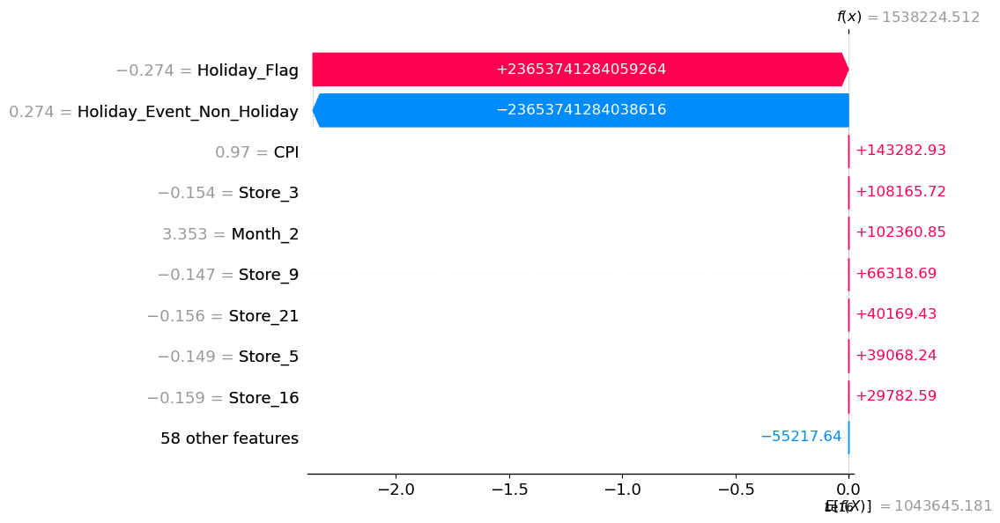

In [39]:
# Reasoning of one single prediction

shap.plots.waterfall(shap_values[0])

### SHAP Waterfall Chart Summary

The SHAP waterfall chart is a highly informative visualization that shows how a model prediction is formed for a specific observation (or predicted value). In this chart, you can observe the individual contribution of each feature and how these contributions affect the predicted target value.

### Chart Overview

*Base Value:* This is the average predicted value of the model. It typically represents the average output of the model across the entire dataset (e.g., the average total sales).

*f(x):* The final prediction value, reached by adding or subtracting contributions from the features to the base value.

Each feature contributes either positively (to the right) or negatively (to the left) to the prediction.

**1. Biggest Contributions**

Holiday_Flag (+236,537): This feature significantly increases the predicted sales. It indicates that sales increase substantially during holiday periods.

Holiday_Event_Non_Holiday (-236,537): On non-holiday days, this feature pulls the prediction down, clearly showing the strong impact of holiday events on the model.

**2. Other Important Features**

CPI (+143,282): The Consumer Price Index increases the prediction, suggesting that general price levels in the economy influence sales.

Month_2 (+102,360): February boosts the prediction, indicating the effect of specific periods (e.g., seasonal events) on sales.

Store-specific Effects (e.g., Store_3, Store_9): Some stores reduce the prediction, which may imply that their performance is lower compared to other stores.

**3. Cumulative Effect**

The feature contributions are added (or subtracted) step by step to the base value to form the final prediction.

The final predicted value f(x) = 1,538,224.512 is shown, which could represent the sales forecast or a related target metric.

**4. General Insights**

Holiday periods and February have a significant impact on model predictions. Seasonal variables, like the Holiday_Flag, are critical for sales predictions.

Economic indicators, such as the CPI, also play a role in the predictions.

Store-based variables can help analyze individual store performance and guide strategic decisions.

In [41]:
#Testing a Linear Regression model with statsmodels

Train_xy = pd.concat([Train_X_std,Train_Y.reset_index(drop=True)],axis=1)
a = Train_xy.columns.values

API = api.ols(formula='{} ~ {}'.format(target,' + '.join(i for i in Train_X.columns)), data=Train_xy).fit()
#print(API.conf_int())
#print(API.pvalues)

API.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Weekly_Sales   R-squared:                       0.950
Model:                            OLS   Adj. R-squared:                  0.949
Method:                 Least Squares   F-statistic:                     1374.
Date:                Mon, 02 Dec 2024   Prob (F-statistic):               0.00
Time:                        20:05:49   Log-Likelihood:                -62725.
No. Observations:                4762   AIC:                         1.256e+05
Df Residuals:                    4696   BIC:                         1.260e+05
Df Model:                          65                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                   1.048e+06   1855.399    564.630      0.000    1.04e+06    1.05e+06
Holiday_Flag                8.011e+16   1.81e+17      0.443      0.658   -2.75e+17    4.35e+17
Temperature                 6743.0834   6587.008      1.024      0.306   -6170.543    1.97e+04
Fuel_Price                  4573.4876   6082.130      0.752      0.452   -7350.342    1.65e+04
CPI                          1.71e+05   6.37e+04      2.686      0.007    4.62e+04    2.96e+05
Unemployment               -5.324e+04   6462.256     -8.239      0.000   -6.59e+04   -4.06e+04
Weekday                     -437.1110    987.627     -0.443      0.658   -2373.322    1499.101
Year_2011                  -2.136e+04   6490.373     -3.292      0.001   -3.41e+04   -8640.352
Year_2012                  -3.418e+04   9369.859     -3.648      0.000   -5.25e+04   -1.58e+04
Holiday_Event_Labour_Day    7.051e+04   3349.186     21.054      0.000    6.39e+04    7.71e+04
Holiday_Event_Non_Holiday   8.011e+16   1.81e+17      0.443      0.658   -2.75e+17    4.35e+17
Holiday_Event_Super_Bowl    6.419e+04   3319.324     19.340      0.000    5.77e+04    7.07e+04
Holiday_Event_Thanksgiving  9.703e+04   2956.217     32.821      0.000    9.12e+04    1.03e+05
Month_2                     3.018e+04   3184.855      9.475      0.000    2.39e+04    3.64e+04
Month_3                     2.165e+04   3675.171      5.891      0.000    1.44e+04    2.89e+04
Month_4                     2.449e+04   4475.606      5.472      0.000    1.57e+04    3.33e+04
Month_5                     2.384e+04   4648.589      5.128      0.000    1.47e+04     3.3e+04
Month_6                     3.292e+04   5178.680      6.357      0.000    2.28e+04    4.31e+04
Month_7                     2.322e+04   5686.700      4.084      0.000    1.21e+04    3.44e+04
Month_8                     2.555e+04   5623.938      4.543      0.000    1.45e+04    3.66e+04
Month_9                     3927.1873   5179.897      0.758      0.448   -6227.843    1.41e+04
Month_10                    1.174e+04   4648.849      2.526      0.012    2626.806    2.09e+04
Month_11                     2.01e+04   3628.035      5.541      0.000     1.3e+04    2.72e+04
Month_12                    1.068e+05   3654.648     29.217      0.000    9.96e+04    1.14e+05
Store_2                     5.368e+04   2567.764     20.906      0.000    4.86e+04    5.87e+04
Store_3                    -1.814e+05   2736.899    -66.262      0.000   -1.87e+05   -1.76e+05
Store_4                      1.19e+05   2.07e+04      5.748      0.000    7.84e+04     1.6e+05
Store_5                    -1.895e+05   2723.848    -69.553      0.000   -1.95e+05   -1.84e+05
Store_6                    -7214.5311   2755.955     -2.618      0.009   -1.26e+04   -1811.565
Store_7                    -1.309e+05   643

### Approach: We can fix these multicollinearity with three techniques:

* Manual Method - Variance Inflation Factor (VIF)
* Automatic Method - Recursive Feature Elimination (RFE)
* Feature Elimination using PCA Decomposition

## 6.2 Multicollinearity Handling Techniques

### 6.2.1 Manual Method-VIF

Dropped Features -->  ['Holiday_Flag', 'CPI', 'Temperature', 'Year_2012', 'Unemployment', 'Holiday_Event_Non_Holiday', 'Month_9', 'Store_30', 'Month_2', 'Month_11', 'Fuel_Price', 'Store_43', 'Store_8', 'Month_10', 'Store_29', 'Month_4', 'Store_25', 'Store_27', 'Store_17', 'Month_3', 'Store_22', 'Store_16', 'Month_7', 'Store_18', 'Store_19', 'Store_15', 'Store_20', 'Month_6', 'Store_32', 'Store_14', 'Store_21', 'Store_13', 'Store_45', 'Store_44', 'Month_5', 'Year_2011', 'Store_23', 'Store_42', 'Store_41', 'Store_11', 'Store_6', 'Store_39', 'Month_8', 'Store_40', 'Store_7', 'Store_34', 'Store_33', 'Store_10', 'Store_31', 'Store_9', 'Month_12', 'Store_2', 'Store_3']


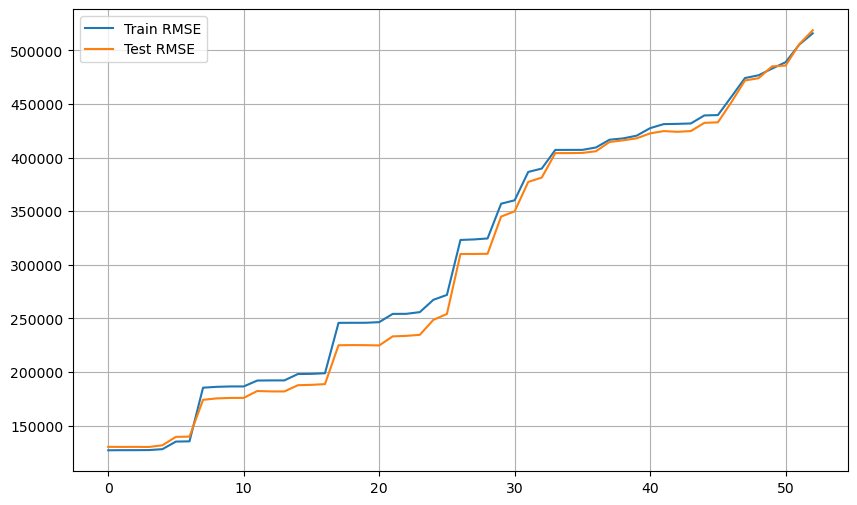

In [45]:
from sklearn.preprocessing import PolynomialFeatures
Trr=[]; Tss=[]; n=3
order=['ord-'+str(i) for i in range(2,n)]

DROP=[];b=[]

for i in range(len(Train_X_std.columns)):
    vif = pd.DataFrame()
    X = Train_X_std.drop(DROP,axis=1)
    vif['Features'] = X.columns
    vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif['VIF'] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False)
    vif.reset_index(drop=True, inplace=True)
    if vif.loc[0][1]>1:
        DROP.append(vif.loc[0][0])
        LR = LinearRegression()
        LR.fit(Train_X_std.drop(DROP,axis=1), Train_Y)

        pred1 = LR.predict(Train_X_std.drop(DROP,axis=1))
        pred2 = LR.predict(Test_X_std.drop(DROP,axis=1))
        
        Trr.append(np.sqrt(mean_squared_error(Train_Y, pred1)))
        Tss.append(np.sqrt(mean_squared_error(Test_Y, pred2)))

print('Dropped Features --> ',DROP)

plt.plot(Trr, label='Train RMSE')
plt.plot(Tss, label='Test RMSE')
#plt.ylim([19.75,20.75])
plt.legend()
plt.grid()
plt.show()

### 6.2.2 Automatic Method-RFE

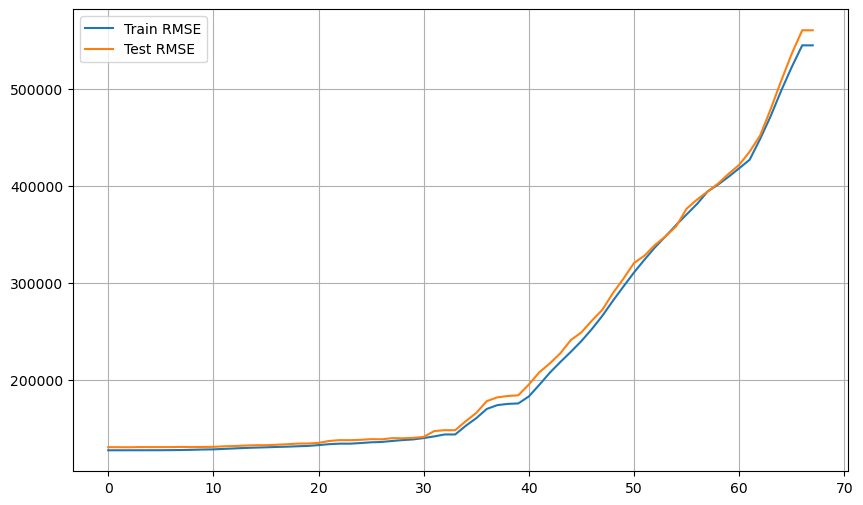

In [47]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Trr = []
Tss = []
n = 3
order = ['ord-' + str(i) for i in range(2, n)]
Trd = pd.DataFrame(np.zeros((10, n - 2)), columns=order)
Tsd = pd.DataFrame(np.zeros((10, n - 2)), columns=order)

m = df.shape[1] - 2  # Total iterations
for i in range(m):
    lm = LinearRegression()
    
    # Ensure at least 1 feature is selected
    n_features_to_select = max(1, Train_X_std.shape[1] - i)
    rfe = RFE(lm, n_features_to_select=n_features_to_select)  # Running RFE
    rfe = rfe.fit(Train_X_std, Train_Y)

    # Train linear regression model on selected features
    LR = LinearRegression()
    LR.fit(Train_X_std.loc[:, rfe.support_], Train_Y)

    # Predict and calculate RMSE for train and test datasets
    pred1 = LR.predict(Train_X_std.loc[:, rfe.support_])
    pred2 = LR.predict(Test_X_std.loc[:, rfe.support_])

    Trr.append(np.sqrt(mean_squared_error(Train_Y, pred1)))
    Tss.append(np.sqrt(mean_squared_error(Test_Y, pred2)))

# Plot the results
plt.plot(Trr, label='Train RMSE')
plt.plot(Tss, label='Test RMSE')
plt.legend()
plt.grid()
plt.show()

### 6.2.3 Feature Elimination using PCA Decomposition

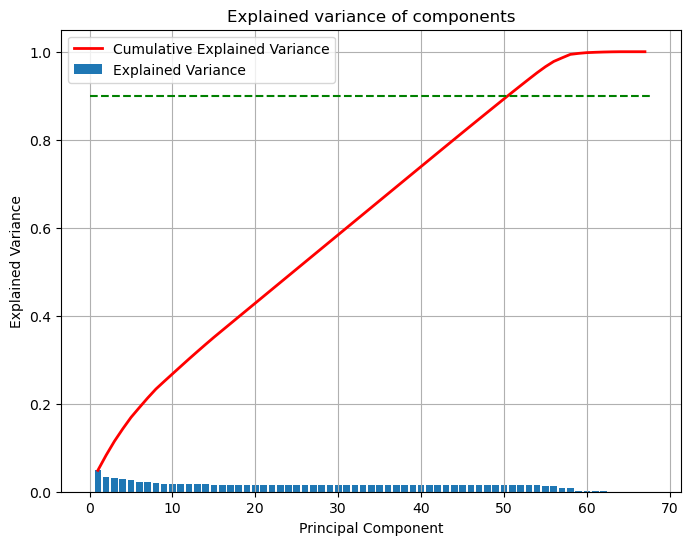

In [49]:
from sklearn.decomposition import PCA

pca = PCA().fit(Train_X_std)

fig, ax = plt.subplots(figsize=(8,6))
x_values = range(1, pca.n_components_+1)
ax.bar(x_values, pca.explained_variance_ratio_, lw=2, label='Explained Variance')
ax.plot(x_values, np.cumsum(pca.explained_variance_ratio_), lw=2, label='Cumulative Explained Variance', color='red')
plt.plot([0,pca.n_components_+1],[0.9,0.9],'g--')
ax.set_title('Explained variance of components')
ax.set_xlabel('Principal Component')
ax.set_ylabel('Explained Variance')
plt.legend()
plt.grid()
plt.show()

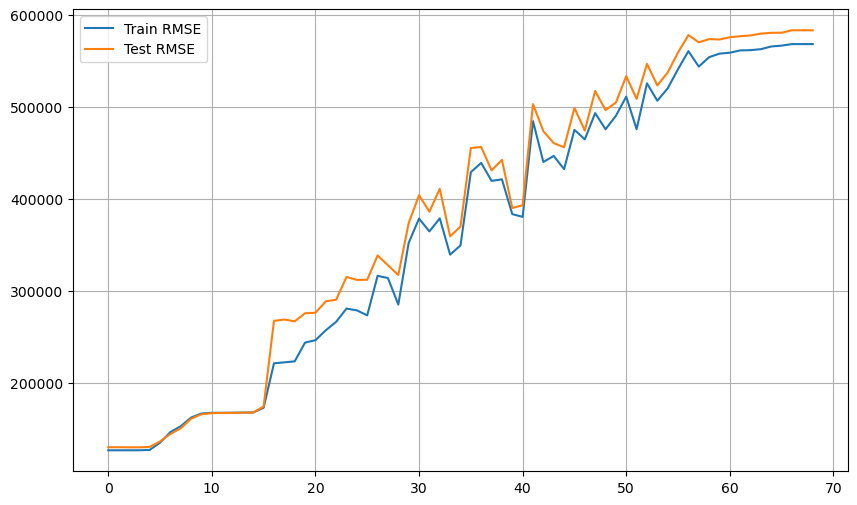

In [50]:
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

Trr = []
Tss = []
n = 3
order = ['ord-' + str(i) for i in range(2, n)]
Trd = pd.DataFrame(np.zeros((10, n - 2)), columns=order)
Tsd = pd.DataFrame(np.zeros((10, n - 2)), columns=order)

m = df.shape[1] - 1  # Total iterations
for i in range(m):
    # Ensure that n_components is at least 1
    n_components = max(1, Train_X_std.shape[1] - i)
    pca = PCA(n_components=n_components)
    
    # Fit and transform PCA on Train_X_std
    Train_X_std_pca = pca.fit_transform(Train_X_std)
    
    # Apply the same transformation to Test_X_std
    Test_X_std_pca = pca.transform(Test_X_std)  # Use transform here instead of fit_transform
    
    # Train linear regression model on PCA-transformed data
    LR = LinearRegression()
    LR.fit(Train_X_std_pca, Train_Y)

    # Predict and calculate RMSE for train and test datasets
    pred1 = LR.predict(Train_X_std_pca)
    pred2 = LR.predict(Test_X_std_pca)

    # Append RMSE values to the lists
    Trr.append(round(np.sqrt(mean_squared_error(Train_Y, pred1)), 2))
    Tss.append(round(np.sqrt(mean_squared_error(Test_Y, pred2)), 2))

# Plot the results
plt.plot(Trr, label='Train RMSE')
plt.plot(Tss, label='Test RMSE')
plt.legend()
plt.grid()
plt.show()

### Insight:
* The model performances remain fairly consistent after applying feature reduction techniques such as VIF, RFE, and PCA. Based on the RMSE plots, the manual RFE method proved most effective, identifying the optimal subset of features by dropping the majority of irrelevant ones. However, we will set these methods aside for now, as advanced machine learning algorithms inherently address multicollinearity issues.

In [52]:
#Shortlisting the selected Features (with RFE)

lm = LinearRegression()
rfe = RFE(lm,n_features_to_select=Train_X_std.shape[1]-28)             # running RFE
rfe = rfe.fit(Train_X_std, Train_Y)

LR = LinearRegression()
LR.fit(Train_X_std.loc[:,rfe.support_], Train_Y)

#print(Train_X_std.loc[:,rfe.support_].columns)

pred1 = LR.predict(Train_X_std.loc[:,rfe.support_])
pred2 = LR.predict(Test_X_std.loc[:,rfe.support_])

print(np.sqrt(mean_squared_error(Train_Y, pred1)))
print(np.sqrt(mean_squared_error(Test_Y, pred2)))

Train_X_std = Train_X_std.loc[:,rfe.support_]
Test_X_std = Test_X_std.loc[:,rfe.support_]

137644.62287206462
139504.0621404255


[🗺️Road Map🧭](#🗺️Road-Map🧭)

# 7. Modelling&Model Performance

In [55]:
#Let us first define a function to evaluate our models

Model_Evaluation_Comparison_Matrix = pd.DataFrame(np.zeros([5,8]), columns=['Train-R2','Test-R2','Train-RSS','Test-RSS',
                                                                            'Train-MSE','Test-MSE','Train-RMSE','Test-RMSE'])
rc=np.random.choice(Train_X_std.loc[:,Train_X_std.nunique()>=50].columns.values,2,replace=True)
def Evaluate(n, pred1,pred2):
    #Plotting predicted predicteds alongside the actual datapoints 
    plt.figure(figsize=[15,6])
    for e,i in enumerate(rc):
        plt.subplot(2,3,e+1)
        plt.scatter(y=Train_Y, x=Train_X_std[i], label='Actual')
        plt.scatter(y=pred1, x=Train_X_std[i], label='Prediction')
        plt.legend()
    plt.show()

    #Evaluating the Multiple Linear Regression Model

    print('\n\n{}Training Set Metrics{}'.format('-'*20, '-'*20))
    print('\nR2-Score on Training set --->',round(r2_score(Train_Y, pred1),20))
    print('Residual Sum of Squares (RSS) on Training set  --->',round(np.sum(np.square(Train_Y-pred1)),20))
    print('Mean Squared Error (MSE) on Training set       --->',round(mean_squared_error(Train_Y, pred1),20))
    print('Root Mean Squared Error (RMSE) on Training set --->',round(np.sqrt(mean_squared_error(Train_Y, pred1)),20))

    print('\n{}Testing Set Metrics{}'.format('-'*20, '-'*20))
    print('\nR2-Score on Testing set --->',round(r2_score(Test_Y, pred2),20))
    print('Residual Sum of Squares (RSS) on Training set  --->',round(np.sum(np.square(Test_Y-pred2)),20))
    print('Mean Squared Error (MSE) on Training set       --->',round(mean_squared_error(Test_Y, pred2),20))
    print('Root Mean Squared Error (RMSE) on Training set --->',round(np.sqrt(mean_squared_error(Test_Y, pred2)),20))
    print('\n{}Residual Plots{}'.format('-'*20, '-'*20))
    
    Model_Evaluation_Comparison_Matrix.loc[n,'Train-R2']  = round(r2_score(Train_Y, pred1),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Test-R2']   = round(r2_score(Test_Y, pred2),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Train-RSS'] = round(np.sum(np.square(Train_Y-pred1)),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Test-RSS']  = round(np.sum(np.square(Test_Y-pred2)),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Train-MSE'] = round(mean_squared_error(Train_Y, pred1),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Test-MSE']  = round(mean_squared_error(Test_Y, pred2),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Train-RMSE']= round(np.sqrt(mean_squared_error(Train_Y, pred1)),20)
    Model_Evaluation_Comparison_Matrix.loc[n,'Test-RMSE'] = round(np.sqrt(mean_squared_error(Test_Y, pred2)),20)

    # Plotting y_test and y_pred to understand the spread.
    plt.figure(figsize=[15,4])

    plt.subplot(1,2,1)
    sns.distplot((Train_Y - pred1))
    plt.title('Error Terms')          
    plt.xlabel('Errors') 

    plt.subplot(1,2,2)
    plt.scatter(Train_Y,pred1)
    plt.plot([Train_Y.min(),Train_Y.max()],[Train_Y.min(),Train_Y.max()], 'r--')
    plt.title('Test vs Prediction')         
    plt.xlabel('y_test')                       
    plt.ylabel('y_pred')                       
    plt.show()

* Let us now try building multiple regression models & compare their evaluation metrics to choose the best fit model both training and testing sets...

### Regression Models Overview

Regression algorithms are essential in statistical modeling and machine learning for predicting a continuous target variable based on one or more predictor variables. Here, we explore five key regression models: Multiple Linear Regression (MLR), Ridge Regression, Lasso Regression, Elastic-Net Regression, and Polynomial Regression.

* *Multiple Linear Regression (MLR)* is the simplest form, modeling the relationship between multiple independent variables and a dependent variable using a linear equation. It assumes a direct linear relationship and is suitable when the relationship between features and target is expected to be linear.

* *Ridge Regression* extends MLR by adding an L2 regularization (penalty), which discourages large coefficients, helping to prevent overfitting, particularly when there is multicollinearity (high correlation between features). It's useful when there are many correlated predictors.

* *Lasso Regression* differs from Ridge by using L1 regularization, which not only reduces the size of the coefficients but also sets some of them to zero, effectively performing feature selection. Lasso is ideal when you suspect that only a subset of the predictors are important.

* *Elastic-Net Regression* combines the strengths of both Ridge and Lasso, using a mix of L1 and L2 penalties. It is effective when dealing with highly correlated predictors and when feature selection and regularization are both needed.

* *Polynomial Regression* takes a non-linear approach, modeling the relationship between the variables using polynomial terms (squared, cubic, etc.). It’s useful when the relationship between variables is curvilinear, although it requires careful handling to avoid overfitting.

### Key Differences and Similarities:

* *MLR* is a simple linear model without regularization, whereas Ridge, Lasso, and Elastic-Net all incorporate regularization to prevent overfitting.
* *Ridge and Elastic-Net* are better suited for datasets with many correlated features, but *Lasso* is specifically useful when feature selection is important.
* *Polynomial Regression* diverges from the others by allowing for non-linear relationships, unlike the inherently linear models (MLR, Ridge, Lasso, Elastic-Net).

### Usage Fields:

* *MLR* is widely used for basic linear relationships and is the default model for regression tasks with independent, linearly related features.
* *Ridge and Elastic-Net* are preferred in scenarios with multicollinearity or many predictors, such as in finance or marketing models.
* *Lasso* is often used when feature selection is important, such as in high-dimensional datasets like genomics or image processing.
* *Polynomial Regression* is valuable when modeling non-linear trends, such as in physical sciences, engineering, or when analyzing curvilinear data.

## 7.1 The Implementation of Multiple Linear Regression(MLR)

### Multiple Linear Regression (MLR)

Description: Multiple Linear Regression is an extension of simple linear regression that models the relationship between two or more features (independent variables) and a continuous target variable (dependent variable) using a linear equation.

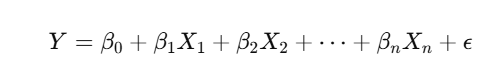

### Key Points:
* Assumes a linear relationship between predictors and target.
* Sensitive to outliers and multicollinearity.
* Assumes homoscedasticity (constant variance of errors).
* Used when there is a direct relationship between multiple features and the dependent variable.

<<<----------------------------------- Evaluating Multiple Linear Regression Model ----------------------------------->>>

The Intercept of the Regresion Model was found to be  1047603.298112138


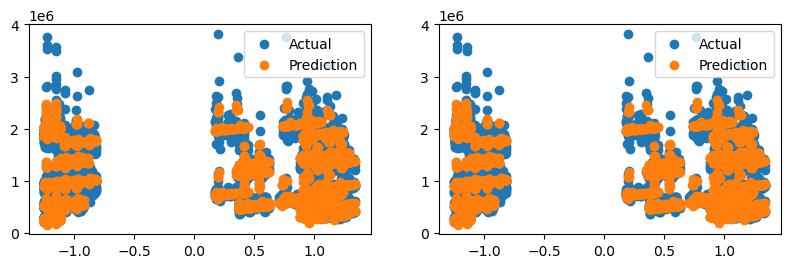



--------------------Training Set Metrics--------------------

R2-Score on Training set ---> 0.941458092289471
Residual Sum of Squares (RSS) on Training set  ---> 90221052983033.38
Mean Squared Error (MSE) on Training set       ---> 18946042205.592896
Root Mean Squared Error (RMSE) on Training set ---> 137644.62287206462

--------------------Testing Set Metrics--------------------

R2-Score on Testing set ---> 0.9431033711682967
Residual Sum of Squares (RSS) on Training set  ---> 23178507574232.516
Mean Squared Error (MSE) on Training set       ---> 19461383353.679695
Root Mean Squared Error (RMSE) on Training set ---> 139504.0621404255

--------------------Residual Plots--------------------


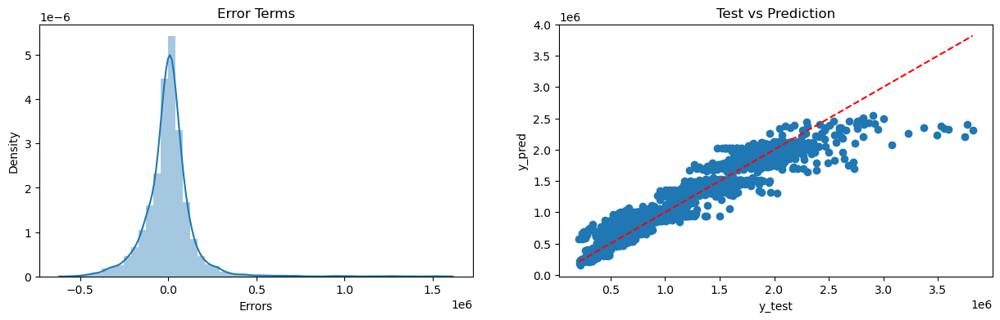

In [60]:
#Linear Regression

MLR = LinearRegression().fit(Train_X_std,Train_Y)
pred1 = MLR.predict(Train_X_std)
pred2 = MLR.predict(Test_X_std)

print('{}{}\033[1m Evaluating Multiple Linear Regression Model \033[0m{}{}\n'.format('<'*3,'-'*35 ,'-'*35,'>'*3))
#print('The Coeffecient of the Regresion Model was found to be ',MLR.coef_)
print('The Intercept of the Regresion Model was found to be ',MLR.intercept_)

Evaluate(0, pred1, pred2)

## 7.2 The Implementation of Ridge Regression Model

### Ridge Regression Model

Description: Ridge regression is a regularized version of linear regression where an L2 penalty is added to the loss function to prevent overfitting by shrinking the coefficients of less important features.

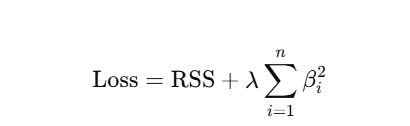

### Key Points:
* Adds a penalty for large coefficients, helping to avoid overfitting.
* Works well when there is multicollinearity (high correlation between independent variables).
* Tends to shrink coefficients toward zero but does not set them exactly to zero.
* Ideal for scenarios with many correlated features.
* Where λ is the regularization parameter.

<<<----------------------------------- Evaluating Ridge Regression Model ----------------------------------->>>

The Intercept of the Regresion Model was found to be  1047603.298112138


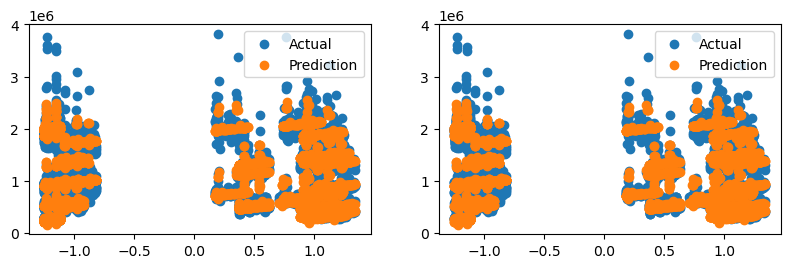



--------------------Training Set Metrics--------------------

R2-Score on Training set ---> 0.9414577975512887
Residual Sum of Squares (RSS) on Training set  ---> 90221507214714.6
Mean Squared Error (MSE) on Training set       ---> 18946137592.33822
Root Mean Squared Error (RMSE) on Training set ---> 137644.9693680747

--------------------Testing Set Metrics--------------------

R2-Score on Testing set ---> 0.9431101336496128
Residual Sum of Squares (RSS) on Training set  ---> 23175752679476.453
Mean Squared Error (MSE) on Training set       ---> 19459070259.84589
Root Mean Squared Error (RMSE) on Training set ---> 139495.77147657878

--------------------Residual Plots--------------------


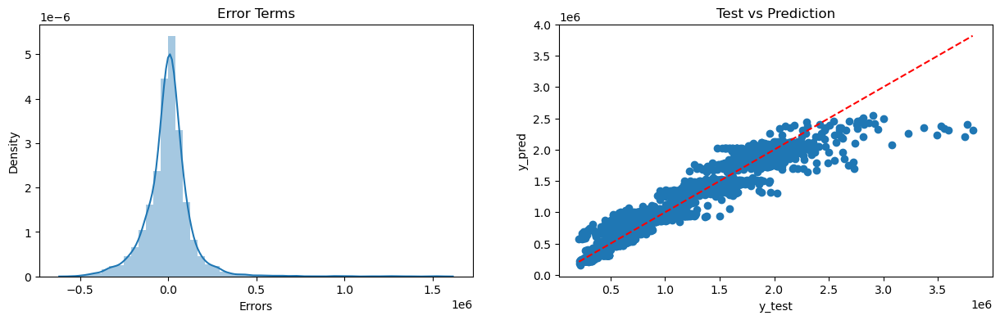

In [63]:
#Creating a Ridge Regression model

RLR = Ridge().fit(Train_X_std,Train_Y)
pred1 = RLR.predict(Train_X_std)
pred2 = RLR.predict(Test_X_std)

print('{}{}\033[1m Evaluating Ridge Regression Model \033[0m{}{}\n'.format('<'*3,'-'*35 ,'-'*35,'>'*3))
#print('The Coeffecient of the Regresion Model was found to be ',MLR.coef_)
print('The Intercept of the Regresion Model was found to be ',MLR.intercept_)

Evaluate(1, pred1, pred2)

## 7.3 The Implementation of Lasso Regression Model

### Lasso Regression Model

Description: Lasso (Least Absolute Shrinkage and Selection Operator) regression is another regularization technique like Ridge, but it uses an L1 penalty. It encourages sparsity by forcing some coefficients to be exactly zero, effectively performing feature selection.

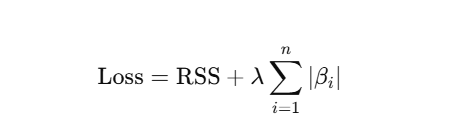

### Key Points:
* Performs automatic feature selection by setting some coefficients to zero.
* More effective than Ridge when only a few features are relevant.
* Less prone to overfitting than multiple linear regression.
* Ideal when you suspect that only a few variables are significant.
* Where λ is the regularization parameter.

<<<----------------------------------- Evaluating Lasso Regression Model ----------------------------------->>>

The Intercept of the Regresion Model was found to be  1047603.298112138


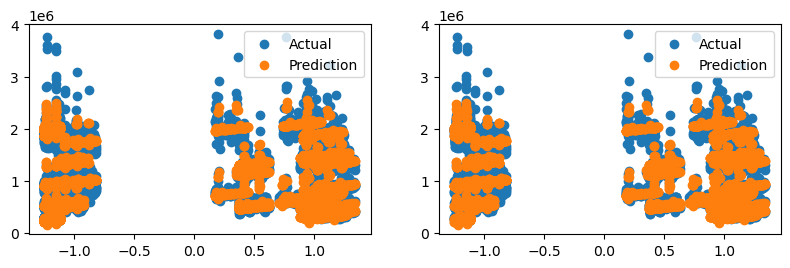



--------------------Training Set Metrics--------------------

R2-Score on Training set ---> 0.9414580918263761
Residual Sum of Squares (RSS) on Training set  ---> 90221053696725.56
Mean Squared Error (MSE) on Training set       ---> 18946042355.46526
Root Mean Squared Error (RMSE) on Training set ---> 137644.6234164824

--------------------Testing Set Metrics--------------------

R2-Score on Testing set ---> 0.9431035544885992
Residual Sum of Squares (RSS) on Training set  ---> 23178432893340.03
Mean Squared Error (MSE) on Training set       ---> 19461320649.319927
Root Mean Squared Error (RMSE) on Training set ---> 139503.83739997953

--------------------Residual Plots--------------------


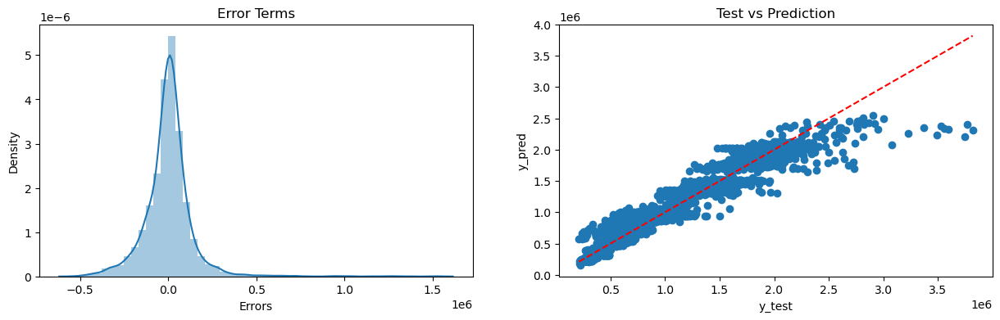

In [66]:
#Creating a Ridge Regression model

LLR = Lasso().fit(Train_X_std,Train_Y)
pred1 = LLR.predict(Train_X_std)
pred2 = LLR.predict(Test_X_std)

print('{}{}\033[1m Evaluating Lasso Regression Model \033[0m{}{}\n'.format('<'*3,'-'*35 ,'-'*35,'>'*3))
#print('The Coeffecient of the Regresion Model was found to be ',MLR.coef_)
print('The Intercept of the Regresion Model was found to be ',MLR.intercept_)

Evaluate(2, pred1, pred2)

## 7.4 The Implementation of Elastic-Net Regression

### Elastic-Net Regression

Description: Elastic-Net regression is a hybrid of Ridge and Lasso regression. It combines both L1 (lasso) and L2 (ridge) penalties to regularize the model, allowing it to handle both correlated features and feature selection.

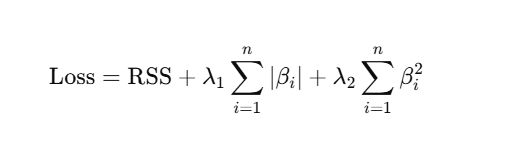

### Key Points:
* Balances the benefits of Lasso and Ridge, making it suitable when there are many correlated features.
* Tends to be more stable than Lasso when there are highly correlated features.
* Can outperform both Ridge and Lasso when feature selection and coefficient shrinkage are necessary.

<<<----------------------------------- Evaluating Elastic-Net Regression Model ----------------------------------->>>

The Intercept of the Regresion Model was found to be  1047603.298112138


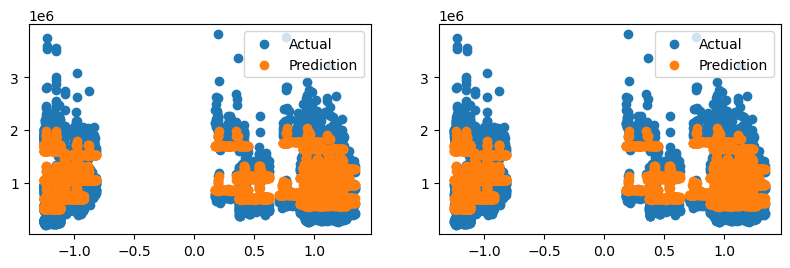



--------------------Training Set Metrics--------------------

R2-Score on Training set ---> 0.79515386190171
Residual Sum of Squares (RSS) on Training set  ---> 315695798130124.9
Mean Squared Error (MSE) on Training set       ---> 66294791711.492
Root Mean Squared Error (RMSE) on Training set ---> 257477.74993480893

--------------------Testing Set Metrics--------------------

R2-Score on Testing set ---> 0.8019086895436666
Residual Sum of Squares (RSS) on Training set  ---> 80698295032259.73
Mean Squared Error (MSE) on Training set       ---> 67756754854.96199
Root Mean Squared Error (RMSE) on Training set ---> 260301.27709053212

--------------------Residual Plots--------------------


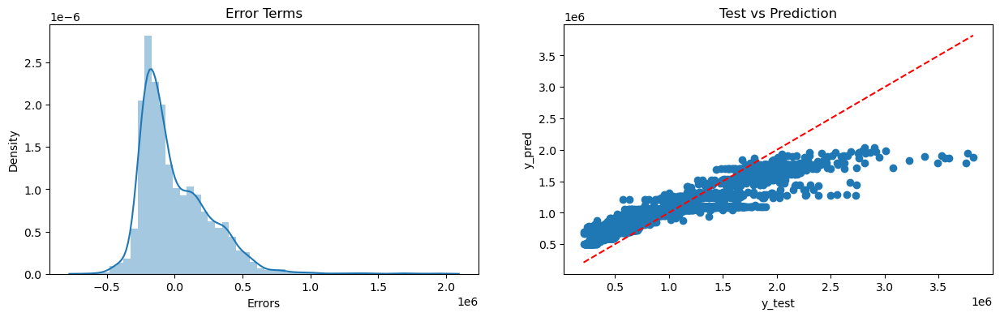

In [69]:
#Creating a ElasticNet Regression model

ENR = ElasticNet().fit(Train_X_std,Train_Y)
pred1 = ENR.predict(Train_X_std)
pred2 = ENR.predict(Test_X_std)

print('{}{}\033[1m Evaluating Elastic-Net Regression Model \033[0m{}{}\n'.format('<'*3,'-'*35 ,'-'*35,'>'*3))
#print('The Coeffecient of the Regresion Model was found to be ',MLR.coef_)
print('The Intercept of the Regresion Model was found to be ',MLR.intercept_)

Evaluate(3, pred1, pred2)

## 7.5 The Implementation of Polynomial Regression Model

### Polynomial Regression Model

Description: Polynomial regression is a type of regression that models the relationship between the independent variable and the dependent variable as an nth-degree polynomial. It is useful when the relationship between the variables is not linear.

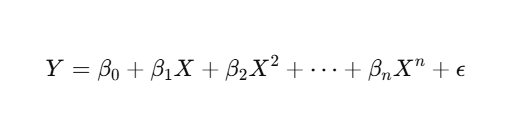

### Key Points:
* Can capture non-linear relationships by adding polynomial terms (squared, cubed, etc.).
* Risk of overfitting if the degree of the polynomial is too high.
* Typically requires careful selection of the polynomial degree to avoid complexity.
* Useful when you expect the relationship between variables to be curvilinear.

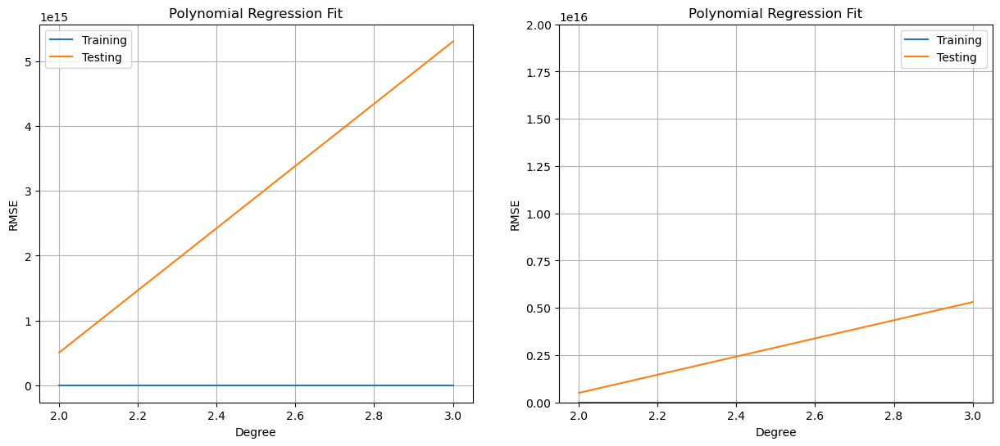

In [72]:
#Checking polynomial regression performance on various degrees

Trr=[]; Tss=[]
n_degree=4

for i in range(2,n_degree):
    #print(f'{i} Degree')
    poly_reg = PolynomialFeatures(degree=i)
    X_poly = poly_reg.fit_transform(Train_X_std)
    X_poly1 = poly_reg.fit_transform(Test_X_std)
    LR = LinearRegression()
    LR.fit(X_poly, Train_Y)
    
    pred1 = LR.predict(X_poly)
    Trr.append(np.sqrt(mean_squared_error(Train_Y, pred1)))
    
    pred2 = LR.predict(X_poly1)
    Tss.append(np.sqrt(mean_squared_error(Test_Y, pred2)))

plt.figure(figsize=[15,6])
plt.subplot(1,2,1)
plt.plot(range(2,n_degree),Trr, label='Training')
plt.plot(range(2,n_degree),Tss, label='Testing')
#plt.plot([1,4],[1,4],'b--')
plt.title('Polynomial Regression Fit')
#plt.ylim([0,5])
plt.xlabel('Degree')
plt.ylabel('RMSE')
plt.grid()
plt.legend()
#plt.xticks()

plt.subplot(1,2,2)
plt.plot(range(2,n_degree),Trr, label='Training')
plt.plot(range(2,n_degree),Tss, label='Testing')
plt.title('Polynomial Regression Fit')
plt.ylim([0,2e16])
plt.xlabel('Degree')
plt.ylabel('RMSE')
plt.grid()
plt.legend()
#plt.xticks()
plt.show()

Insight: We can choose 2nd order polynomial regression as it gives the optimal training & testing scores...

<<<----------------------------------- Evaluating Polynomial Regression Model ----------------------------------->>>

The Coeffecient of the Regresion Model was found to be  [ -52883.73828931  244442.79592115   63024.45047867   52883.73828931
   67724.67707044  100016.53436457   89046.77014785   63563.429639
 -169542.34199385  161219.97523908 -171792.58962678 -122299.3391388
  -95310.01473926 -140606.60428     142309.17933975  -24966.66585013
  159226.42690949  106335.52255219  -56492.63618138 -130551.30444584
   67807.62856956   98817.86780475 -112109.71858011   52163.63410988
   55717.06009931 -118816.3869878   118981.52521263  -71643.41038953
 -168967.99353265  -15173.77251351  -30330.46369759 -105650.71274643
 -171663.58123219 -149987.27031311  -21952.20631625  -60264.05108836
 -129332.14163414  -97321.8343961   -80347.72545848]
The Intercept of the Regresion Model was found to be  1047603.298112138


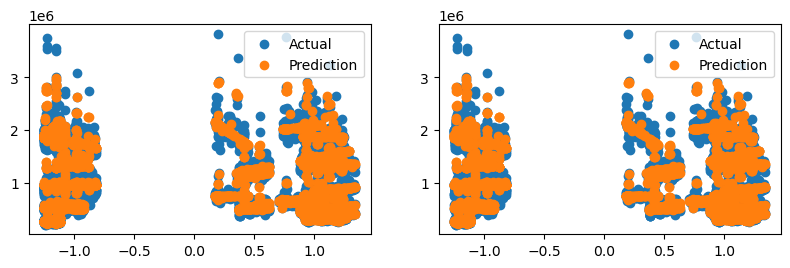



--------------------Training Set Metrics--------------------

R2-Score on Training set ---> 0.9601811839044421
Residual Sum of Squares (RSS) on Training set  ---> 61366218785399.34
Mean Squared Error (MSE) on Training set       ---> 12886648211.969624
Root Mean Squared Error (RMSE) on Training set ---> 113519.37372963974

--------------------Testing Set Metrics--------------------

R2-Score on Testing set ---> -7.467905966916355e+17
Residual Sum of Squares (RSS) on Training set  ---> 3.0422701409925523e+32
Mean Squared Error (MSE) on Training set       ---> 2.5543829899181803e+29
Root Mean Squared Error (RMSE) on Training set ---> 505409041264417.75

--------------------Residual Plots--------------------


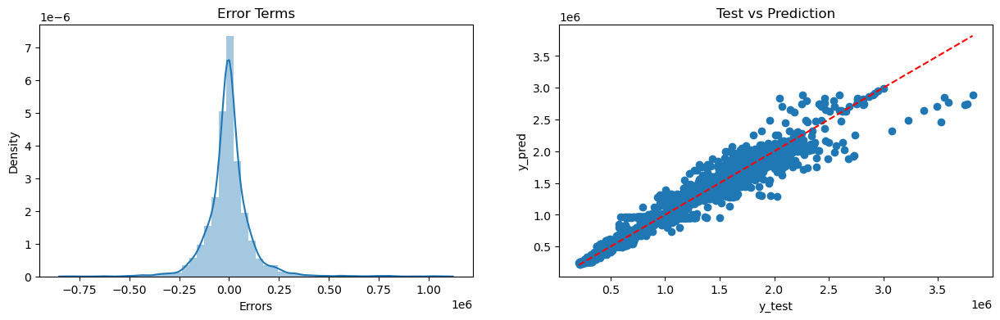

In [74]:
#Using the 2nd Order Polynomial Regression model (degree=2)

poly_reg = PolynomialFeatures(degree=2)
X_poly = poly_reg.fit_transform(Train_X_std)
X_poly1 = poly_reg.fit_transform(Test_X_std)
PR = LinearRegression()
PR.fit(X_poly, Train_Y)

pred1 = PR.predict(X_poly)
pred2 = PR.predict(X_poly1)

print('{}{}\033[1m Evaluating Polynomial Regression Model \033[0m{}{}\n'.format('<'*3,'-'*35 ,'-'*35,'>'*3))
print('The Coeffecient of the Regresion Model was found to be ',MLR.coef_)
print('The Intercept of the Regresion Model was found to be ',MLR.intercept_)

Evaluate(4, pred1, pred2)

## 7.6 Comparing the Evaluation Metrics of the Models

In [76]:
# Regression Models Results Evaluation

EMC = Model_Evaluation_Comparison_Matrix.copy()
EMC.index = ['Multiple Linear Regression (MLR)','Ridge Linear Regression (RLR)','Lasso Linear Regression (LLR)','Elastic-Net Regression (ENR)','Polynomial Regression (PNR)']
EMC

,Train-R2,Test-R2,Train-RSS,Test-RSS,Train-MSE,Test-MSE,Train-RMSE,Test-RMSE
Multiple Linear Regression (MLR),0.94,0.94,"90,221,052,983,033.38","23,178,507,574,232.52","18,946,042,205.59","19,461,383,353.68","137,644.62","139,504.06"
Ridge Linear Regression (RLR),0.94,0.94,"90,221,507,214,714.59","23,175,752,679,476.45","18,946,137,592.34","19,459,070,259.85","137,644.97","139,495.77"
Lasso Linear Regression (LLR),0.94,0.94,"90,221,053,696,725.56","23,178,432,893,340.03","18,946,042,355.47","19,461,320,649.32","137,644.62","139,503.84"
Elastic-Net Regression (ENR),0.80,0.80,"315,695,798,130,124.88","80,698,295,032,259.73","66,294,791,711.49","67,756,754,854.96","257,477.75","260,301.28"
Polynomial Regression (PNR),0.96,"-746,790,596,691,635,456.00","61,366,218,785,399.34","304,227,014,099,255,225,283,724,785,483,776.00","12,886,648,211.97","255,438,298,991,818,031,124,778,582,016.00","113,519.37","505,409,041,264,417.75"


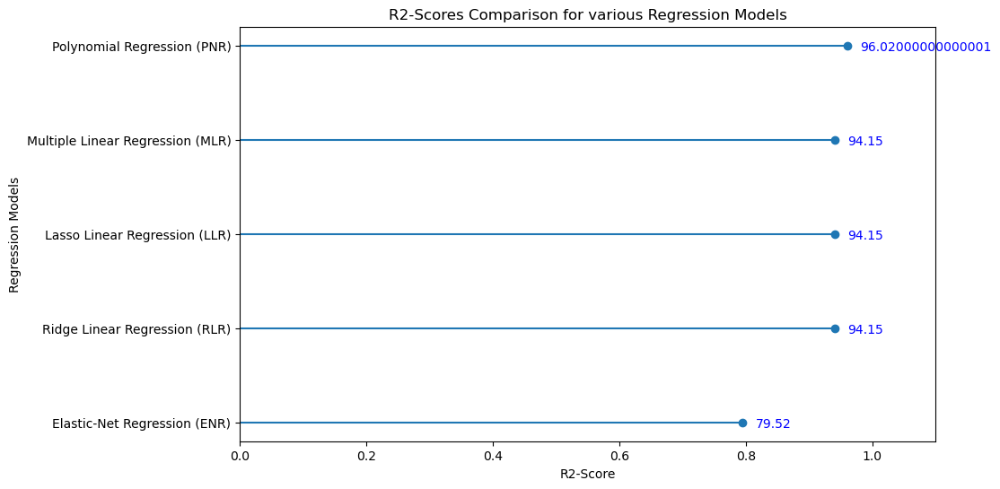

In [77]:
# R2-Scores Comparison for different Regression Models

R2 = round(EMC['Train-R2'].sort_values(ascending=True),4)
plt.hlines(y=R2.index, xmin=0, xmax=R2.values)
plt.plot(R2.values, R2.index,'o')
plt.title('R2-Scores Comparison for various Regression Models')
plt.xlabel('R2-Score')
plt.ylabel('Regression Models')
for i, v in enumerate(R2):
    plt.text(v+0.02, i-0.05, str(v*100), color='blue')
plt.xlim([0,1.1])
#apply_formatter()
plt.show()

### Insight:

From the above plot, it is clear that the polynomial regresion models have the highest explainability power to understand the dataset.

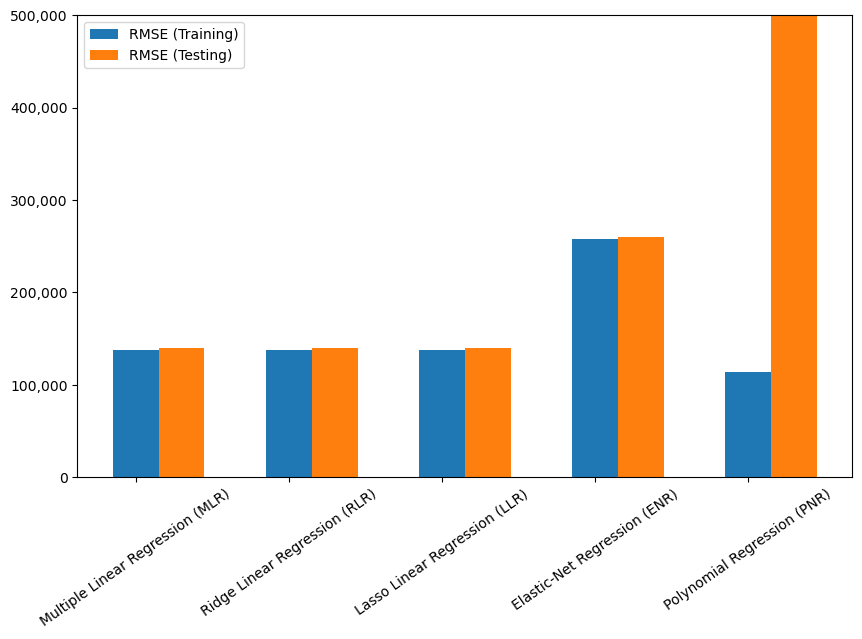

In [79]:
# Root Mean SquaredError Comparison for different Regression Models

cc = Model_Evaluation_Comparison_Matrix.columns.values
s=5

plt.bar(np.arange(5), Model_Evaluation_Comparison_Matrix[cc[6]].values, width=0.3, label='RMSE (Training)')
plt.bar(np.arange(5)+0.3, Model_Evaluation_Comparison_Matrix[cc[7]].values, width=0.3, label='RMSE (Testing)')
plt.xticks(np.arange(5),EMC.index, rotation =35)
plt.legend()
plt.ylim([0,500000])
apply_formatter()
plt.show()

In [80]:
Test_X_std.columns

Index(['Holiday_Flag', 'CPI', 'Holiday_Event_Labour_Day',
       'Holiday_Event_Non_Holiday', 'Holiday_Event_Super_Bowl',
       'Holiday_Event_Thanksgiving', 'Month_12', 'Store_2', 'Store_3',
       'Store_4', 'Store_5', 'Store_7', 'Store_8', 'Store_9', 'Store_10',
       'Store_11', 'Store_13', 'Store_14', 'Store_15', 'Store_16', 'Store_19',
       'Store_20', 'Store_21', 'Store_23', 'Store_24', 'Store_25', 'Store_27',
       'Store_29', 'Store_30', 'Store_31', 'Store_32', 'Store_33', 'Store_36',
       'Store_37', 'Store_38', 'Store_42', 'Store_43', 'Store_44', 'Store_45'],
      dtype='object')

In [81]:
df[Test_X_std.columns]

,Holiday_Flag,CPI,Holiday_Event_Labour_Day,Holiday_Event_Non_Holiday,Holiday_Event_Super_Bowl,Holiday_Event_Thanksgiving,Month_12,Store_2,Store_3,Store_4,...,Store_31,Store_32,Store_33,Store_36,Store_37,Store_38,Store_42,Store_43,Store_44,Store_45
0,False,211.10,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,True,211.24,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,211.29,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,211.32,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,211.35,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5948,False,192.01,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
5949,False,192.17,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
5950,False,192.33,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
5951,False,192.33,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


### Insight:

* The lower the RMSE, the better the model's performance! Additionally, the model's training and testing scores should be closely aligned to ensure consistency. In this case, it is evident that the polynomial regression models are overfitting the data. Surprisingly, the simple Multiple Linear Regression model delivered the best results.

In [83]:
#Linear Regression

# MLR = LinearRegression().fit(Train_X_std,Train_Y)
# pred1 = MLR.predict(Train_X_std)
# pred2 = MLR.predict(Test_X_std)

# Generate predictions for all stores
df['Sales_Predictions'] = MLR.predict(StandardScaler().fit_transform(df[Test_X_std.columns]))  

df

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour_Day,...,Store_39,Store_40,Store_41,Store_42,Store_43,Store_44,Store_45,Factor1,Factor2,Sales_Predictions
0,"1,643,690.90",False,42.31,2.57,211.10,8.11,4,False,False,False,...,False,False,False,False,False,False,False,0.85,1.26,"1,439,464.42"
1,"1,641,957.44",True,38.51,2.55,211.24,8.11,4,False,False,False,...,False,False,False,False,False,False,False,0.84,1.47,"1,500,648.83"
2,"1,611,968.17",False,39.93,2.51,211.29,8.11,4,False,False,False,...,False,False,False,False,False,False,False,0.85,1.39,"1,440,671.90"
3,"1,409,727.59",False,46.63,2.56,211.32,8.11,4,False,False,False,...,False,False,False,False,False,False,False,0.87,1.02,"1,440,862.94"
4,"1,554,806.68",False,46.50,2.62,211.35,8.11,4,False,False,False,...,False,False,False,False,False,False,False,0.87,1.03,"1,441,053.97"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5948,"713,173.95",False,64.88,4.00,192.01,8.68,4,False,True,False,...,False,False,False,False,False,False,True,0.45,-0.13,"795,190.32"
5949,"733,455.07",False,64.89,3.98,192.17,8.67,4,False,True,False,...,False,False,False,False,False,False,True,0.45,-0.13,"796,172.76"
5950,"734,464.36",False,54.47,4.00,192.33,8.67,4,False,True,False,...,False,False,False,False,False,False,True,0.42,0.45,"797,155.20"
5951,"718,125.53",False,56.47,3.97,192.33,8.67,4,False,True,False,...,False,False,False,False,False,False,True,0.43,0.34,"797,177.68"


In [84]:
# Get store numbers from dummy columns

store_numbers = [col.split('_')[1] for col in df.columns if col.startswith('Store_')]
store_numbers = list(map(int, store_numbers))  # Convert to integers

In [85]:
import pandas as pd
import numpy as np

# Ensure reproducibility
np.random.seed(42)

# Generate random latitude and longitude values
latitudes = np.random.uniform(25, 50, len(store_numbers))  # Approx. latitude range for the USA
longitudes = np.random.uniform(-125, -65, len(store_numbers))  # Approx. longitude range for the USA

# Create a DataFrame with store coordinates
store_coordinates = pd.DataFrame({
    'Store': store_numbers,
    'Latitude': latitudes,
    'Longitude': longitudes
})

In [86]:
# Create a mapping function to retrieve the store number from dummy columns

def get_store_number(row):
    for col in df.columns:
        if col.startswith('Store_') and row[col] == 1:
            return int(col.split('_')[1])

# Add a new 'Store' column based on dummy-encoded data
df['Store'] = df.apply(get_store_number, axis=1)

# Merge coordinates into your DataFrame
df = df.merge(store_coordinates, on='Store', how='left')

In [87]:
df

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour_Day,...,Store_42,Store_43,Store_44,Store_45,Factor1,Factor2,Sales_Predictions,Store,Latitude,Longitude
0,"1,643,690.90",False,42.31,2.57,211.10,8.11,4,False,False,False,...,False,False,False,False,0.85,1.26,"1,439,464.42",NaN,NaN,NaN
1,"1,641,957.44",True,38.51,2.55,211.24,8.11,4,False,False,False,...,False,False,False,False,0.84,1.47,"1,500,648.83",NaN,NaN,NaN
2,"1,611,968.17",False,39.93,2.51,211.29,8.11,4,False,False,False,...,False,False,False,False,0.85,1.39,"1,440,671.90",NaN,NaN,NaN
3,"1,409,727.59",False,46.63,2.56,211.32,8.11,4,False,False,False,...,False,False,False,False,0.87,1.02,"1,440,862.94",NaN,NaN,NaN
4,"1,554,806.68",False,46.50,2.62,211.35,8.11,4,False,False,False,...,False,False,False,False,0.87,1.03,"1,441,053.97",NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5948,"713,173.95",False,64.88,4.00,192.01,8.68,4,False,True,False,...,False,False,False,True,0.45,-0.13,"795,190.32",45.00,47.73,-86.75
5949,"733,455.07",False,64.89,3.98,192.17,8.67,4,False,True,False,...,False,False,False,True,0.45,-0.13,"796,172.76",45.00,47.73,-86.75
5950,"734,464.36",False,54.47,4.00,192.33,8.67,4,False,True,False,...,False,False,False,True,0.42,0.45,"797,155.20",45.00,47.73,-86.75
5951,"718,125.53",False,56.47,3.97,192.33,8.67,4,False,True,False,...,False,False,False,True,0.43,0.34,"797,177.68",45.00,47.73,-86.75


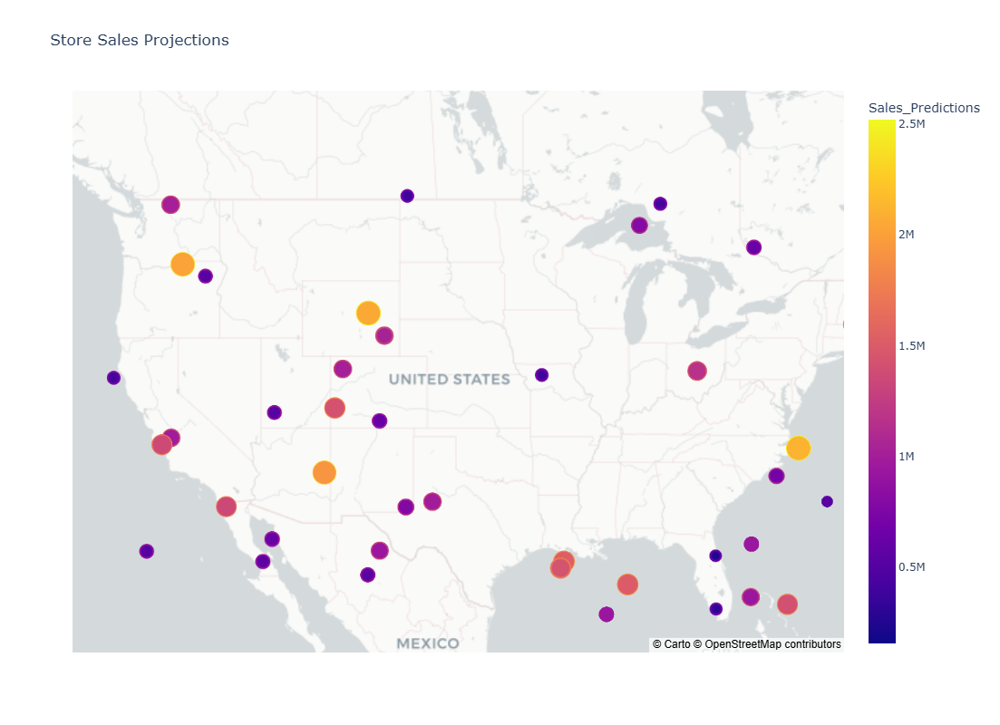

In [88]:
import plotly.express as px

# Example DataFrame
fig = px.scatter_mapbox(
    df,
    lat='Latitude',
    lon='Longitude',
    size='Sales_Predictions',
    color='Sales_Predictions',
    hover_name='Store',
    mapbox_style='carto-positron',
    title='Store Sales Projections'
)

# Update hovertemplate to add thousand separators for 'Sales_Predictions'
fig.update_traces(
    hovertemplate='<b>Store: %{hovertext}</b><br>' +
                  'Sales Prediction: %{marker.size:,.0f}' +  # Adds thousand separators
                  '<extra></extra>'  # Remove extra trace information
)

# Adjust the figure size by modifying layout
fig.update_layout(
    width=1200,  # Adjust width (pixels)
    height=800   # Adjust height (pixels)
)

fig.show()

In [89]:
df.columns

Index(['Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI',
       'Unemployment', 'Weekday', 'Year_2011', 'Year_2012',
       'Holiday_Event_Labour_Day', 'Holiday_Event_Non_Holiday',
       'Holiday_Event_Super_Bowl', 'Holiday_Event_Thanksgiving', 'Month_2',
       'Month_3', 'Month_4', 'Month_5', 'Month_6', 'Month_7', 'Month_8',
       'Month_9', 'Month_10', 'Month_11', 'Month_12', 'Store_2', 'Store_3',
       'Store_4', 'Store_5', 'Store_6', 'Store_7', 'Store_8', 'Store_9',
       'Store_10', 'Store_11', 'Store_12', 'Store_13', 'Store_14', 'Store_15',
       'Store_16', 'Store_17', 'Store_18', 'Store_19', 'Store_20', 'Store_21',
       'Store_22', 'Store_23', 'Store_24', 'Store_25', 'Store_26', 'Store_27',
       'Store_28', 'Store_29', 'Store_30', 'Store_31', 'Store_32', 'Store_33',
       'Store_34', 'Store_35', 'Store_36', 'Store_37', 'Store_38', 'Store_39',
       'Store_40', 'Store_41', 'Store_42', 'Store_43', 'Store_44', 'Store_45',
       'Factor1', 'Factor2', 

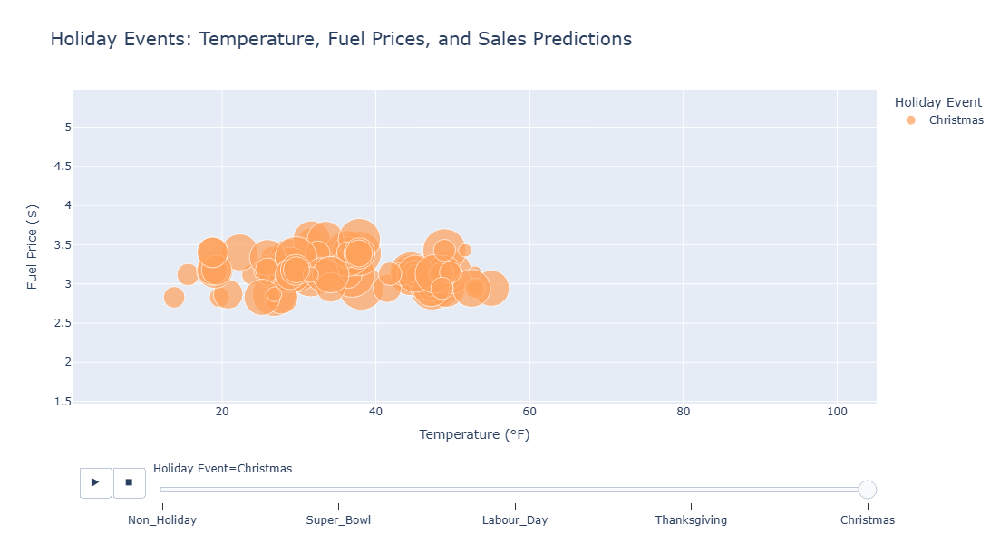

In [90]:
import pandas as pd
import plotly.express as px

# Define Dummy encoded Holiday_Event columns
holiday_columns = [col for col in df.columns if col.startswith('Holiday_Event_')]

# If it is missing, add the 'Holiday_Event_Christmas' column
if 'Holiday_Event_Christmas' not in holiday_columns:
    df['Holiday_Event_Christmas'] = 0  # Sıfırlarla ekle
    holiday_columns.append('Holiday_Event_Christmas')

# Find the active category from Dummy encoded columns and create a new column
df['Holiday Event'] = df[holiday_columns].idxmax(axis=1).str.replace('Holiday_Event_', '')

# If all of the columns are "0", change 'Holiday_Event_Christmas' to "1"
no_holiday_rows = df[holiday_columns].sum(axis=1) == 0
df.loc[no_holiday_rows, 'Holiday_Event_Christmas'] = 1
df.loc[no_holiday_rows, 'Holiday Event'] = 'Christmas'

# Scatter plot (with animation)
fig = px.scatter(
    df,
    x='Temperature',               # X : Temperature
    y='Fuel_Price',                # Y: Fuel Price
    size='Sales_Predictions',      # Baloon size: Sales Prediction
    color='Holiday Event',         # Baloon color: Holiday Event
    animation_frame='Holiday Event',  # Animation: Holiday Event
    hover_name='Store',            # Hover: Store
    title='Holiday Events: Temperature, Fuel Prices, and Sales Predictions',
    labels={
        'Temperature': 'Temperature (°F)',
        'Fuel_Price': 'Fuel Price ($)',
        'Sales_Predictions': 'Predicted Sales'
    },
    size_max=40,                   # Max balloon size
    color_discrete_sequence=px.colors.qualitative.Plotly  # Colour palette
)

# Update hovertemplate to add thousand separators for 'Sales_Predictions'
fig.update_traces(
    hovertemplate='<b>Store: %{hovertext}</b><br>' +
                  'Sales Prediction: %{marker.size:,.0f}' +  # Adds thousand separators
                  '<extra></extra>'  # Remove extra trace information
)



# Edit graphic size
fig.update_layout(
    width=1000,
    height=600,
    title_font=dict(size=20),
    xaxis=dict(title='Temperature (°F)', range=[df['Temperature'].min() - 5, df['Temperature'].max() + 5]),
    yaxis=dict(title='Fuel Price ($)', range=[df['Fuel_Price'].min() - 1, df['Fuel_Price'].max() + 1])
)

# Animation speed
fig.layout.updatemenus[0].buttons[0].args[1]['frame']['duration'] = 2000  # Animasyon hızı: 1 saniye

fig.show()

In [91]:
df

,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Weekday,Year_2011,Year_2012,Holiday_Event_Labour_Day,...,Store_44,Store_45,Factor1,Factor2,Sales_Predictions,Store,Latitude,Longitude,Holiday_Event_Christmas,Holiday Event
0,"1,643,690.90",False,42.31,2.57,211.10,8.11,4,False,False,False,...,False,False,0.85,1.26,"1,439,464.42",NaN,NaN,NaN,0,Non_Holiday
1,"1,641,957.44",True,38.51,2.55,211.24,8.11,4,False,False,False,...,False,False,0.84,1.47,"1,500,648.83",NaN,NaN,NaN,0,Super_Bowl
2,"1,611,968.17",False,39.93,2.51,211.29,8.11,4,False,False,False,...,False,False,0.85,1.39,"1,440,671.90",NaN,NaN,NaN,0,Non_Holiday
3,"1,409,727.59",False,46.63,2.56,211.32,8.11,4,False,False,False,...,False,False,0.87,1.02,"1,440,862.94",NaN,NaN,NaN,0,Non_Holiday
4,"1,554,806.68",False,46.50,2.62,211.35,8.11,4,False,False,False,...,False,False,0.87,1.03,"1,441,053.97",NaN,NaN,NaN,0,Non_Holiday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5948,"713,173.95",False,64.88,4.00,192.01,8.68,4,False,True,False,...,False,True,0.45,-0.13,"795,190.32",45.00,47.73,-86.75,0,Non_Holiday
5949,"733,455.07",False,64.89,3.98,192.17,8.67,4,False,True,False,...,False,True,0.45,-0.13,"796,172.76",45.00,47.73,-86.75,0,Non_Holiday
5950,"734,464.36",False,54.47,4.00,192.33,8.67,4,False,True,False,...,False,True,0.42,0.45,"797,155.20",45.00,47.73,-86.75,0,Non_Holiday
5951,"718,125.53",False,56.47,3.97,192.33,8.67,4,False,True,False,...,False,True,0.43,0.34,"797,177.68",45.00,47.73,-86.75,0,Non_Holiday


# 8. Conclusion

Here are some of the key outcomes of the project:
* The project involved analyzing a small dataset of 6,435 samples, with 7.5% removed during preprocessing.
* Data visualization revealed key insights into feature relationships, while high multicollinearity was addressed using the Variance Inflation Factor (VIF) technique for feature selection.
* Testing multiple algorithms with default hyperparameters provided a comparative understanding of model performance. Ultimately, regression models with comparable results were chosen for their strong performance and generalizability.

# 9. References
* https://www.kaggle.com/datasets/yasserh/walmart-dataset
* https://www.kaggle.com/code/yasserh/walmart-sales-prediction-best-ml-algorithms/notebook
* https://www.kaggle.com/code/aslanahmedov/walmart-sales-forecasting

[🗺️Road Map🧭](#🗺️Road-Map🧭)